In [1]:
import pandas as pd
import numpy as np

import os

import keras
import tensorflow
from tsfeatures import tsfeatures

Using TensorFlow backend.


In [2]:
# Set Project Working Directory
project_path = '/workspace/portfolio'

#os.getcwd()
os.chdir(project_path)

#os.environ
#pd.set_option('display.max_columns', None)

data_path = f"{project_path}/data"
data_path

'/workspace/portfolio/data'

In [3]:
# Data 

#https://www.kaggle.com/jeanmidev/smart-meters-in-london

all_files = os.listdir(data_path + "/hhblock_dataset/hhblock_dataset/")

df_from_each_file = (pd.read_csv(data_path + "/hhblock_dataset/hhblock_dataset/" + f, sep=',') for f in all_files)
df_merged   = pd.concat(df_from_each_file, ignore_index=True)


In [4]:
df_merged.head()

,LCLid,day,hh_0,hh_1,hh_2,hh_3,hh_4,hh_5,hh_6,hh_7,...,hh_38,hh_39,hh_40,hh_41,hh_42,hh_43,hh_44,hh_45,hh_46,hh_47
0,MAC000013,2012-06-22,0.127,0.113,0.076,0.109,0.120,0.096,0.113,0.148,...,0.086,0.154,0.121,0.102,0.131,0.121,0.082,0.096,0.127,0.126
1,MAC000013,2012-06-23,0.106,0.135,0.228,0.079,0.109,0.117,0.079,0.122,...,0.107,0.113,0.106,0.077,0.119,0.126,0.151,0.135,0.108,0.093
2,MAC000013,2012-06-25,0.099,0.119,0.169,0.136,0.109,0.090,0.132,0.131,...,0.140,0.135,0.134,0.106,0.131,0.169,0.170,0.141,0.163,0.137
3,MAC000013,2012-06-26,0.142,0.103,0.117,0.136,0.127,0.129,0.150,0.137,...,0.136,0.136,0.304,0.159,0.126,0.145,0.196,0.158,0.173,0.149
4,MAC000013,2012-06-27,0.126,0.128,0.175,0.163,0.119,0.103,0.128,0.141,...,0.170,0.144,0.098,0.183,0.316,0.190,0.121,0.176,0.158,0.146


In [5]:
df_merged.describe()

,hh_0,hh_1,hh_2,hh_3,hh_4,hh_5,hh_6,hh_7,hh_8,hh_9,...,hh_38,hh_39,hh_40,hh_41,hh_42,hh_43,hh_44,hh_45,hh_46,hh_47
count,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,...,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06,3.469352e+06
mean,1.793072e-01,1.692932e-01,1.519922e-01,1.380636e-01,1.279240e-01,1.216967e-01,1.170615e-01,1.142551e-01,1.132509e-01,1.157545e-01,...,3.210049e-01,3.208214e-01,3.157999e-01,3.099201e-01,3.000736e-01,2.876654e-01,2.663366e-01,2.422332e-01,2.144095e-01,1.872155e-01
std,3.088122e-01,3.291034e-01,2.980318e-01,2.655244e-01,2.373366e-01,2.196538e-01,2.076232e-01,1.968073e-01,1.902580e-01,1.920647e-01,...,3.681264e-01,3.630246e-01,3.521579e-01,3.423600e-01,3.301152e-01,3.189805e-01,3.027963e-01,2.849761e-01,2.649418e-01,2.419260e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,5.200000e-02,4.800000e-02,4.600000e-02,4.400000e-02,4.200000e-02,4.200000e-02,4.100000e-02,4.100000e-02,4.000000e-02,4.100000e-02,...,1.010000e-01,1.050000e-01,1.080000e-01,1.090000e-01,1.080000e-01,1.030000e-01,9.200000e-02,7.900000e-02,6.700000e-02,5.800000e-02
50%,9.800000e-02,8.800000e-02,8.100000e-02,7.700000e-02,7.400000e-02,7.200000e-02,7.100000e-02,7.000000e-02,7.000000e-02,7.100000e-02,...,2.010000e-01,2.050000e-01,2.070000e-01,2.070000e-01,2.030000e-01,1.950000e-01,1.780000e-01,1.580000e-01,1.340000e-01,1.130000e-01
75%,1.910000e-01,1.680000e-01,1.500000e-01,1.380000e-01,1.300000e-01,1.250000e-01,1.220000e-01,1.200000e-01,1.190000e-01,1.220000e-01,...,3.900000e-01,3.890000e-01,3.820000e-01,3.750000e-01,3.630000e-01,3.490000e-01,3.230000e-01,2.940000e-01,2.580000e-01,2.210000e-01
max,7.272000e+00,8.717000e+00,8.025000e+00,8.750000e+00,8.414000e+00,8.591000e+00,7.357000e+00,7.676000e+00,7.581000e+00,7.568000e+00,...,8.833000e+00,9.141000e+00,8.998000e+00,9.189000e+00,8.539000e+00,9.257000e+00,7.819000e+00,8.051000e+00,7.769000e+00,8.411000e+00


In [6]:

#df = pd.wide_to_long(df_merged, stubnames = "hh_", i = ['day', 'LCLid'], j = "hh").sort_values(["day", "hh"]).reset_index()

In [7]:
# Unique Number of Sensor meters
ids = pd.DataFrame(df_merged['LCLid'].unique()).sample(n = 500)
ids.columns = ['id']

df = df_merged.loc[df_merged['LCLid'].isin(ids["id"])]
df.head()

,LCLid,day,hh_0,hh_1,hh_2,hh_3,hh_4,hh_5,hh_6,hh_7,...,hh_38,hh_39,hh_40,hh_41,hh_42,hh_43,hh_44,hh_45,hh_46,hh_47
4064,MAC000532,2012-03-29,0.013,0.019,0.018,0.086,0.030,0.018,0.011,0.073,...,0.084,0.082,0.035,0.041,0.084,0.070,0.039,0.027,0.060,0.064
4065,MAC000532,2012-03-30,0.018,0.017,0.037,0.076,0.016,0.015,0.030,0.090,...,0.025,0.020,0.075,0.081,0.036,0.030,0.074,0.049,0.017,0.019
4066,MAC000532,2012-03-31,0.067,0.044,0.020,0.014,0.056,0.054,0.020,0.012,...,0.045,0.087,0.145,0.097,0.040,0.036,0.062,0.054,0.018,0.020
4067,MAC000532,2012-04-01,0.039,0.083,0.015,0.017,0.019,0.065,0.047,0.019,...,0.125,0.084,0.153,0.055,0.039,0.045,0.085,0.070,0.019,0.013
4068,MAC000532,2012-04-02,0.054,0.080,0.012,0.020,0.019,0.068,0.047,0.018,...,0.042,0.038,0.060,0.097,0.036,0.023,0.018,0.075,0.049,0.019


In [8]:
# Unique Number of Sensor meters
ids = pd.DataFrame(df_merged['LCLid'].unique())
ids.columns = ['id']
ids.shape
#df = df_merged.loc[df_merged['LCLid'].isin(ids["id"])]
#df.head()


(5560, 1)

In [74]:
def calc_lr_stats(ids, df):
    
    # filter df based on ids
    df = df.loc[df['LCLid'].isin(ids["id"])]

    # pivot wide to long
    df = (pd.wide_to_long(df, stubnames = "hh_", i = ['day', 'LCLid'], j = "hh")
        .sort_values(["day", "hh"])
        .reset_index())
    
    # import time lookup
    #lookup = pd.read_csv(data_path + "/time-lookup.csv", sep = ",")

    df.columns = ['ds', 'unique_id', 'hh', 'y']

    df = df[["ds", "unique_id", "y"]].dropna()
    
    # calculate 
    features = df.groupby(["unique_id"]).agg(["max", "mean"])
    
    #features = df.head()
    return pd.DataFrame(features)

ts = calc_lr_stats(ids = ids.sample(11), df = df_merged)
ts.head()

y          
             max      mean
unique_id                 
MAC000182  1.831  0.126434
MAC000925  2.455  0.299435
MAC001055  2.305  0.164702
MAC001404  4.450  0.358477
MAC002333  1.843  0.079225

In [9]:
def calc_features(ids, df):
    
    # filter df based on ids
    df = df.loc[df['LCLid'].isin(ids["id"])]

    # pivot wide to long
    df = (pd.wide_to_long(df, stubnames = "hh_", i = ['day', 'LCLid'], j = "hh")
        .sort_values(["day", "hh"])
        .reset_index())
    
    # import time lookup
    #lookup = pd.read_csv(data_path + "/time-lookup.csv", sep = ",")

    df.columns = ['ds', 'unique_id', 'hh', 'y']

    df = df[["ds", "unique_id", "y"]].dropna()
    
    # calculate ts_features
    features = tsfeatures(df, freq = 1, features = [stl_features, acf_features, entropy])
    #features = df.head()
    return pd.DataFrame(features).drop(["hw_alpha", "hw_beta", "hw_gamma", "nperiods", "beta"], axis = 1)

check = calc_features(ids = ids.sample(11), df = df_merged)
check.head()

,unique_id,hurst,series_length,unitroot_pp,unitroot_kpss,stability,seasonal_period,trend,spike,linearity,...,flat_spots,entropy,crossing_points,arch_lm,x_acf1,x_acf10,diff1_acf1,diff1_acf10,diff2_acf1,diff2_acf10
0,MAC000064,0.731673,38735,-12863.982924,3.902225,0.455833,1,0.038830,8.292848e-09,-12.786814,...,417,0.819104,5080,0.206141,0.693782,1.126213,-0.188997,0.061582,-0.515589,0.271867
1,MAC000164,0.908902,37439,-7834.864961,6.090377,0.694749,1,0.169258,2.302051e-09,-24.279327,...,233,0.720098,3953,0.461468,0.825774,3.556338,-0.211586,0.063095,-0.539187,0.291911
2,MAC000391,0.998642,34031,-18236.059888,1.464600,0.453546,1,0.005919,1.051794e-07,-5.209264,...,272,0.880198,6416,0.495895,0.614810,1.124484,-0.294673,0.105111,-0.564738,0.321429
3,MAC000926,0.898246,31631,-12157.441300,2.469793,0.433336,1,0.016424,6.288470e-09,-5.819347,...,45,0.706421,5042,0.076281,0.653508,0.981420,-0.231679,0.075908,-0.538052,0.292395
4,MAC001874,0.780720,30047,-15294.084060,1.298493,0.420037,1,0.036425,9.607857e-09,-3.118277,...,30,0.848619,7616,0.199200,0.606326,0.908117,-0.297264,0.096831,-0.592217,0.360205


In [155]:
check.columns

Index(['unique_id', 'hurst', 'series_length', 'unitroot_pp', 'unitroot_kpss',
       'stability', 'seasonal_period', 'trend', 'spike', 'linearity',
       'curvature', 'e_acf1', 'e_acf10', 'x_pacf5', 'diff1x_pacf5',
       'diff2x_pacf5', 'nonlinearity', 'lumpiness', 'alpha', 'arch_acf',
       'garch_acf', 'arch_r2', 'garch_r2', 'flat_spots', 'entropy',
       'crossing_points', 'arch_lm', 'x_acf1', 'x_acf10', 'diff1_acf1',
       'diff1_acf10', 'diff2_acf1', 'diff2_acf10', 'max', 'mean', 'cluster'],
      dtype='object')

In [75]:
from tqdm import tqdm

batch_size = 10  #chunk row size

# Use List Comprehension to create a list of data frame batches
list_df = [ids[i:i + batch_size] for i in range(0,ids.shape[0],batch_size)]

rs = []

for i in tqdm(list_df):
    print(i)
    try:
        rs.append(calc_features(i, df = df_merged))
    except:
        print("Failed to generate features")
    
    

  0%|          | 0/556 [00:00<?, ?it/s]

          id
0  MAC000013
1  MAC000016
2  MAC000081
3  MAC000195
4  MAC000343
5  MAC000401
6  MAC000532
7  MAC000566
8  MAC000623
9  MAC000734


  0%|          | 1/556 [00:00<08:21,  1.11it/s]

           id
10  MAC000751
11  MAC000761
12  MAC000811
13  MAC000872
14  MAC000881
15  MAC001085
16  MAC001178
17  MAC001286
18  MAC001309
19  MAC001336


  0%|          | 2/556 [00:01<08:15,  1.12it/s]

           id
20  MAC001397
21  MAC001486
22  MAC001581
23  MAC001666
24  MAC002262
25  MAC002291
26  MAC002295
27  MAC002373
28  MAC002664
29  MAC002742


  1%|          | 3/556 [00:02<08:13,  1.12it/s]

           id
30  MAC002848
31  MAC002952
32  MAC002961
33  MAC003048
34  MAC003076
35  MAC003149
36  MAC003162
37  MAC004141
38  MAC004172
39  MAC004240


  1%|          | 4/556 [00:03<07:59,  1.15it/s]

           id
40  MAC004241
41  MAC004464
42  MAC004763
43  MAC004772
44  MAC004853
45  MAC005476
46  MAC005484
47  MAC005512
48  MAC005518
49  MAC005530


  1%|          | 5/556 [00:04<08:10,  1.12it/s]

           id
50  MAC000010
51  MAC000043
52  MAC000089
53  MAC000091
54  MAC000119
55  MAC000946
56  MAC000965
57  MAC001016
58  MAC001118
59  MAC001297


  1%|          | 6/556 [00:05<08:21,  1.10it/s]

           id
60  MAC001951
61  MAC002188
62  MAC002246
63  MAC002300
64  MAC003372
65  MAC003436
66  MAC003439
67  MAC003528
68  MAC003581
69  MAC003626


  1%|▏         | 7/556 [00:06<08:01,  1.14it/s]

           id
70  MAC003638
71  MAC003682
72  MAC003684
73  MAC003722
74  MAC003753
75  MAC003758
76  MAC003808
77  MAC003852
78  MAC003865
79  MAC003897


  1%|▏         | 8/556 [00:06<07:34,  1.21it/s]

           id
80  MAC003899
81  MAC003991
82  MAC004095
83  MAC004098
84  MAC004107
85  MAC004114
86  MAC004155
87  MAC004321
88  MAC004391
89  MAC004423


  2%|▏         | 9/556 [00:07<07:36,  1.20it/s]

           id
90  MAC004440
91  MAC004457
92  MAC004494
93  MAC004929
94  MAC004956
95  MAC005035
96  MAC005048
97  MAC005229
98  MAC005448
99  MAC005508


  2%|▏         | 10/556 [00:08<08:00,  1.14it/s]

            id
100  MAC000213
101  MAC000363
102  MAC000427
103  MAC000474
104  MAC000491
105  MAC000514
106  MAC000757
107  MAC000786
108  MAC000929
109  MAC001468


  2%|▏         | 11/556 [00:09<07:59,  1.14it/s]

            id
110  MAC001530
111  MAC001639
112  MAC001762
113  MAC001775
114  MAC001887
115  MAC002167
116  MAC002299
117  MAC002387
118  MAC002463
119  MAC002547


  2%|▏         | 12/556 [00:10<07:50,  1.16it/s]

            id
120  MAC002734
121  MAC002770
122  MAC002870
123  MAC002893
124  MAC003062
125  MAC003136
126  MAC003207
127  MAC003296
128  MAC003301
129  MAC003373


  2%|▏         | 13/556 [00:11<07:30,  1.20it/s]

            id
130  MAC003376
131  MAC003379
132  MAC003433
133  MAC003516
134  MAC003883
135  MAC003929
136  MAC003988
137  MAC004011
138  MAC004017
139  MAC004021


  3%|▎         | 14/556 [00:11<07:17,  1.24it/s]

            id
140  MAC004076
141  MAC004085
142  MAC004165
143  MAC004479
144  MAC004873
145  MAC005049
146  MAC005089
147  MAC005140
148  MAC005153
149  MAC005520


  3%|▎         | 15/556 [00:12<07:28,  1.21it/s]

            id
150  MAC000183
151  MAC000278
152  MAC000453
153  MAC000470
154  MAC000519
155  MAC000605
156  MAC000710
157  MAC000725
158  MAC000754
159  MAC001139


  3%|▎         | 16/556 [00:13<07:46,  1.16it/s]

            id
160  MAC001508
161  MAC001542
162  MAC001587
163  MAC001602
164  MAC001680
165  MAC001690
166  MAC001739
167  MAC001782
168  MAC001784
169  MAC001786


  3%|▎         | 17/556 [00:14<07:35,  1.18it/s]

            id
170  MAC001789
171  MAC001790
172  MAC001793
173  MAC001802
174  MAC001805
175  MAC001870
176  MAC001940
177  MAC002104
178  MAC002136
179  MAC002149


  3%|▎         | 18/556 [00:15<07:25,  1.21it/s]

            id
180  MAC002163
181  MAC002189
182  MAC002220
183  MAC002956
184  MAC002957
185  MAC002960
186  MAC002964
187  MAC002973
188  MAC002984
189  MAC003080


  3%|▎         | 19/556 [00:16<07:27,  1.20it/s]

            id
190  MAC003796
191  MAC003904
192  MAC004032
193  MAC004060
194  MAC004134
195  MAC004151
196  MAC004204
197  MAC004271
198  MAC004338
199  MAC005133


  4%|▎         | 20/556 [00:17<07:31,  1.19it/s]

            id
200  MAC000321
201  MAC000324
202  MAC000327
203  MAC000330
204  MAC000828
205  MAC000851
206  MAC000868
207  MAC000877
208  MAC000878
209  MAC000895


  4%|▍         | 21/556 [00:17<07:38,  1.17it/s]

            id
210  MAC000910
211  MAC000935
212  MAC000939
213  MAC000942
214  MAC000945
215  MAC000982
216  MAC000991
217  MAC000993
218  MAC001014
219  MAC001015


  4%|▍         | 22/556 [00:18<07:49,  1.14it/s]

            id
220  MAC001024
221  MAC001030
222  MAC001075
223  MAC001087
224  MAC001096
225  MAC001097
226  MAC001950
227  MAC001954
228  MAC001957
229  MAC001960


  4%|▍         | 23/556 [00:19<07:37,  1.17it/s]

            id
230  MAC001962
231  MAC001963
232  MAC001970
233  MAC001972
234  MAC001978
235  MAC001979
236  MAC001987
237  MAC001990
238  MAC002002
239  MAC002007


  4%|▍         | 24/556 [00:20<07:30,  1.18it/s]

            id
240  MAC002018
241  MAC002019
242  MAC002026
243  MAC002027
244  MAC002042
245  MAC002047
246  MAC002058
247  MAC002064
248  MAC002066
249  MAC002072


  4%|▍         | 25/556 [00:21<07:12,  1.23it/s]

            id
250  MAC000111
251  MAC000428
252  MAC000493
253  MAC000659
254  MAC000662
255  MAC000667
256  MAC001046
257  MAC001059
258  MAC001095
259  MAC001783


  5%|▍         | 26/556 [00:22<07:17,  1.21it/s]

            id
260  MAC001874
261  MAC001892
262  MAC001955
263  MAC002178
264  MAC002195
265  MAC002223
266  MAC002288
267  MAC002362
268  MAC002385
269  MAC002396


  5%|▍         | 27/556 [00:22<07:23,  1.19it/s]

            id
270  MAC002833
271  MAC003185
272  MAC003398
273  MAC003401
274  MAC003402
275  MAC003448
276  MAC003458
277  MAC003468
278  MAC003497
279  MAC003498


  5%|▌         | 28/556 [00:23<07:04,  1.24it/s]

            id
280  MAC003517
281  MAC003518
282  MAC003523
283  MAC003535
284  MAC003537
285  MAC003545
286  MAC003550
287  MAC003560
288  MAC003563
289  MAC003590


  5%|▌         | 29/556 [00:24<06:50,  1.28it/s]

            id
290  MAC003605
291  MAC003608
292  MAC003620
293  MAC003623
294  MAC003624
295  MAC003786
296  MAC003793
297  MAC003887
298  MAC004524
299  MAC005501


  5%|▌         | 30/556 [00:25<06:45,  1.30it/s]

            id
300  MAC000156
301  MAC000163
302  MAC000167
303  MAC000229
304  MAC000232
305  MAC000238
306  MAC000240
307  MAC000468
308  MAC000476
309  MAC000479


  6%|▌         | 31/556 [00:26<07:27,  1.17it/s]

            id
310  MAC000501
311  MAC000553
312  MAC000783
313  MAC000787
314  MAC000788
315  MAC000794
316  MAC000795
317  MAC000799
318  MAC000813
319  MAC000826


  6%|▌         | 32/556 [00:27<07:32,  1.16it/s]

            id
320  MAC003431
321  MAC003811
322  MAC003905
323  MAC003928
324  MAC003937
325  MAC003941
326  MAC004145
327  MAC004163
328  MAC004175
329  MAC004188


  6%|▌         | 33/556 [00:27<07:23,  1.18it/s]

            id
330  MAC004362
331  MAC004396
332  MAC004400
333  MAC004445
334  MAC004451
335  MAC004456
336  MAC004551
337  MAC004578
338  MAC004643
339  MAC004646


  6%|▌         | 34/556 [00:28<07:37,  1.14it/s]

            id
340  MAC004688
341  MAC004698
342  MAC004708
343  MAC004725
344  MAC004726
345  MAC004732
346  MAC004739
347  MAC004747
348  MAC005341
349  MAC005396


  6%|▋         | 35/556 [00:29<07:46,  1.12it/s]

            id
350  MAC000038
351  MAC000559
352  MAC000680
353  MAC000712
354  MAC000790
355  MAC000792
356  MAC001010
357  MAC001174
358  MAC001323
359  MAC001536


  6%|▋         | 36/556 [00:30<07:53,  1.10it/s]

            id
360  MAC001586
361  MAC001597
362  MAC001761
363  MAC001797
364  MAC002151
365  MAC002398
366  MAC002643
367  MAC002701
368  MAC002722
369  MAC003175


  7%|▋         | 37/556 [00:31<07:55,  1.09it/s]

            id
370  MAC003277
371  MAC003300
372  MAC003310
373  MAC003311
374  MAC003316
375  MAC003459
376  MAC003481
377  MAC003491
378  MAC003576
379  MAC003640


  7%|▋         | 38/556 [00:32<07:17,  1.18it/s]

            id
380  MAC003703
381  MAC003705
382  MAC003706
383  MAC003728
384  MAC003738
385  MAC003763
386  MAC003765
387  MAC003783
388  MAC003816
389  MAC003838


  7%|▋         | 39/556 [00:33<06:47,  1.27it/s]

            id
390  MAC003972
391  MAC004224
392  MAC004248
393  MAC004626
394  MAC004841
395  MAC004847
396  MAC005102
397  MAC005338
398  MAC005357
399  MAC005371


  7%|▋         | 40/556 [00:33<06:57,  1.24it/s]

            id
400  MAC000313
401  MAC000333
402  MAC000334
403  MAC000635
404  MAC000641
405  MAC001449
406  MAC001509
407  MAC001554
408  MAC001640
409  MAC001648


  7%|▋         | 41/556 [00:34<07:09,  1.20it/s]

            id
410  MAC001657
411  MAC001663
412  MAC001672
413  MAC001673
414  MAC001684
415  MAC001692
416  MAC001703
417  MAC001714
418  MAC001715
419  MAC001738


  8%|▊         | 42/556 [00:35<07:11,  1.19it/s]

            id
420  MAC001744
421  MAC001747
422  MAC001748
423  MAC001751
424  MAC001755
425  MAC001773
426  MAC001777
427  MAC001785
428  MAC001791
429  MAC001798


  8%|▊         | 43/556 [00:36<06:59,  1.22it/s]

            id
430  MAC001811
431  MAC001817
432  MAC001824
433  MAC001829
434  MAC001840
435  MAC001904
436  MAC002117
437  MAC002419
438  MAC002424
439  MAC002426


  8%|▊         | 44/556 [00:37<07:00,  1.22it/s]

            id
440  MAC002427
441  MAC002438
442  MAC002475
443  MAC002483
444  MAC002501
445  MAC002511
446  MAC005414
447  MAC005435
448  MAC005452
449  MAC005458


  8%|▊         | 45/556 [00:38<07:02,  1.21it/s]

            id
450  MAC000028
451  MAC000049
452  MAC000057
453  MAC000367
454  MAC000368
455  MAC000372
456  MAC000374
457  MAC000875
458  MAC000892
459  MAC000896


  8%|▊         | 46/556 [00:38<07:20,  1.16it/s]

            id
460  MAC000903
461  MAC000905
462  MAC000916
463  MAC000918
464  MAC000936
465  MAC000940
466  MAC000941
467  MAC001053
468  MAC001056
469  MAC001060


  8%|▊         | 47/556 [00:39<07:31,  1.13it/s]

            id
470  MAC001099
471  MAC001109
472  MAC001111
473  MAC001115
474  MAC001117
475  MAC001123
476  MAC001134
477  MAC001138
478  MAC001144
479  MAC001148


  9%|▊         | 48/556 [00:40<07:15,  1.17it/s]

            id
480  MAC001149
481  MAC001152
482  MAC001154
483  MAC001158
484  MAC001160
485  MAC001161
486  MAC001163
487  MAC003648
488  MAC003665
489  MAC003954


  9%|▉         | 49/556 [00:41<07:09,  1.18it/s]

            id
490  MAC004062
491  MAC004106
492  MAC004118
493  MAC004144
494  MAC004152
495  MAC004159
496  MAC004239
497  MAC004245
498  MAC004260
499  MAC004303


  9%|▉         | 50/556 [00:42<07:12,  1.17it/s]

            id
500  MAC000011
501  MAC000046
502  MAC000067
503  MAC000100
504  MAC000107
505  MAC000410
506  MAC000433
507  MAC000860
508  MAC000913
509  MAC001119


  9%|▉         | 51/556 [00:43<07:15,  1.16it/s]

            id
510  MAC001205
511  MAC001244
512  MAC001340
513  MAC001409
514  MAC001480
515  MAC001484
516  MAC001485
517  MAC001524
518  MAC001551
519  MAC001607


  9%|▉         | 52/556 [00:44<07:18,  1.15it/s]

            id
520  MAC001675
521  MAC001816
522  MAC001932
523  MAC002076
524  MAC002147
525  MAC002242
526  MAC002369
527  MAC002739
528  MAC003026
529  MAC003086


 10%|▉         | 53/556 [00:45<07:19,  1.14it/s]

            id
530  MAC003112
531  MAC003177
532  MAC003205
533  MAC003209
534  MAC003215
535  MAC003217
536  MAC003437
537  MAC003549
538  MAC003704
539  MAC004057


 10%|▉         | 54/556 [00:45<07:08,  1.17it/s]

            id
540  MAC004265
541  MAC004286
542  MAC004309
543  MAC004359
544  MAC004952
545  MAC005046
546  MAC005054
547  MAC005085
548  MAC005096
549  MAC005125


 10%|▉         | 55/556 [00:46<07:18,  1.14it/s]

            id
550  MAC000306
551  MAC000307
552  MAC000308
553  MAC000681
554  MAC000709
555  MAC000716
556  MAC000719
557  MAC000722
558  MAC002120
559  MAC002121


 10%|█         | 56/556 [00:47<07:27,  1.12it/s]

            id
560  MAC002125
561  MAC002130
562  MAC002133
563  MAC002135
564  MAC002141
565  MAC002142
566  MAC002143
567  MAC002244
568  MAC002372
569  MAC002504


 10%|█         | 57/556 [00:48<07:21,  1.13it/s]

            id
570  MAC002571
571  MAC002573
572  MAC002581
573  MAC002583
574  MAC002584
575  MAC002587
576  MAC002588
577  MAC002641
578  MAC002644
579  MAC002691


 10%|█         | 58/556 [00:49<07:16,  1.14it/s]

            id
580  MAC002693
581  MAC002697
582  MAC002724
583  MAC002727
584  MAC002729
585  MAC002730
586  MAC002740
587  MAC002744
588  MAC005282
589  MAC005285


 11%|█         | 59/556 [00:50<07:19,  1.13it/s]

            id
590  MAC005293
591  MAC005311
592  MAC005333
593  MAC005334
594  MAC005343
595  MAC005346
596  MAC005378
597  MAC005382
598  MAC005390
599  MAC005391


 11%|█         | 60/556 [00:51<07:35,  1.09it/s]

            id
600  MAC000098
601  MAC000198
602  MAC000247
603  MAC000261
604  MAC000265
605  MAC000286
606  MAC000328
607  MAC000366
608  MAC001248
609  MAC001296


 11%|█         | 61/556 [00:52<07:55,  1.04it/s]

            id
610  MAC001300
611  MAC001301
612  MAC001308
613  MAC001310
614  MAC001312
615  MAC001327
616  MAC001368
617  MAC001377
618  MAC001382
619  MAC001390


 11%|█         | 62/556 [00:53<07:40,  1.07it/s]

            id
620  MAC001391
621  MAC001685
622  MAC001696
623  MAC001778
624  MAC002275
625  MAC002278
626  MAC002286
627  MAC002301
628  MAC002520
629  MAC002585


 11%|█▏        | 63/556 [00:54<07:23,  1.11it/s]

            id
630  MAC002586
631  MAC002589
632  MAC002640
633  MAC002650
634  MAC002651
635  MAC002672
636  MAC002682
637  MAC002684
638  MAC002698
639  MAC002731


 12%|█▏        | 64/556 [00:54<07:15,  1.13it/s]

            id
640  MAC002733
641  MAC002738
642  MAC002746
643  MAC002748
644  MAC002753
645  MAC002755
646  MAC002769
647  MAC002794
648  MAC005305
649  MAC005325


 12%|█▏        | 65/556 [00:55<07:11,  1.14it/s]

            id
650  MAC000026
651  MAC000052
652  MAC000105
653  MAC000109
654  MAC000377
655  MAC000808
656  MAC000815
657  MAC000863
658  MAC000866
659  MAC000871


 12%|█▏        | 66/556 [00:56<07:21,  1.11it/s]

            id
660  MAC000883
661  MAC000957
662  MAC001070
663  MAC001539
664  MAC001613
665  MAC001638
666  MAC001873
667  MAC001928
668  MAC002005
669  MAC002148


 12%|█▏        | 67/556 [00:57<07:14,  1.13it/s]

            id
670  MAC002247
671  MAC002358
672  MAC002380
673  MAC002555
674  MAC003093
675  MAC003100
676  MAC003229
677  MAC003364
678  MAC004318
679  MAC004360


 12%|█▏        | 68/556 [00:58<07:09,  1.13it/s]

            id
680  MAC004439
681  MAC004448
682  MAC004590
683  MAC004653
684  MAC004666
685  MAC004677
686  MAC004686
687  MAC004704
688  MAC004718
689  MAC004760


 12%|█▏        | 69/556 [00:59<07:04,  1.15it/s]

            id
690  MAC004911
691  MAC004915
692  MAC004916
693  MAC004924
694  MAC004976
695  MAC004987
696  MAC005015
697  MAC005380
698  MAC005504
699  MAC005517


 13%|█▎        | 70/556 [01:00<07:21,  1.10it/s]

            id
700  MAC000030
701  MAC000040
702  MAC000103
703  MAC000110
704  MAC000112
705  MAC000339
706  MAC000464
707  MAC000487
708  MAC000593
709  MAC000609


 13%|█▎        | 71/556 [01:01<07:38,  1.06it/s]

            id
710  MAC000797
711  MAC001653
712  MAC001736
713  MAC001819
714  MAC001836
715  MAC002113
716  MAC002134
717  MAC002199
718  MAC002260
719  MAC002552


 13%|█▎        | 72/556 [01:02<07:12,  1.12it/s]

            id
720  MAC002959
721  MAC003196
722  MAC003257
723  MAC003286
724  MAC003474
725  MAC003536
726  MAC003606
727  MAC003634
728  MAC003683
729  MAC003807


 13%|█▎        | 73/556 [01:02<06:45,  1.19it/s]

            id
730  MAC003895
731  MAC004054
732  MAC004258
733  MAC004374
734  MAC004436
735  MAC004554
736  MAC004713
737  MAC004789
738  MAC004872
739  MAC004900


 13%|█▎        | 74/556 [01:03<06:58,  1.15it/s]

            id
740  MAC004988
741  MAC004997
742  MAC005042
743  MAC005062
744  MAC005160
745  MAC005283
746  MAC005406
747  MAC005421
748  MAC005468
749  MAC005523


 13%|█▎        | 75/556 [01:04<07:04,  1.13it/s]

            id
750  MAC000004
751  MAC000438
752  MAC000443
753  MAC000444
754  MAC000448
755  MAC000516
756  MAC000518
757  MAC000526
758  MAC000538
759  MAC000540


 14%|█▎        | 76/556 [01:05<07:00,  1.14it/s]

            id
760  MAC000546
761  MAC000562
762  MAC001274
763  MAC001279
764  MAC001299
765  MAC001651
766  MAC001655
767  MAC001687
768  MAC001699
769  MAC001701


 14%|█▍        | 77/556 [01:06<06:49,  1.17it/s]

            id
770  MAC001702
771  MAC001707
772  MAC001712
773  MAC001716
774  MAC001720
775  MAC001725
776  MAC001737
777  MAC001741
778  MAC001745
779  MAC001753


 14%|█▍        | 78/556 [01:07<06:42,  1.19it/s]

            id
780  MAC001754
781  MAC001889
782  MAC001895
783  MAC001896
784  MAC001902
785  MAC001905
786  MAC005180
787  MAC005189
788  MAC005190
789  MAC005197


 14%|█▍        | 79/556 [01:08<06:47,  1.17it/s]

            id
790  MAC005204
791  MAC005212
792  MAC005250
793  MAC005279
794  MAC005284
795  MAC005290
796  MAC005291
797  MAC005292
798  MAC005306
799  MAC005507


 14%|█▍        | 80/556 [01:09<07:06,  1.12it/s]

            id
800  MAC000184
801  MAC000188
802  MAC000210
803  MAC000211
804  MAC000215
805  MAC000217
806  MAC000502
807  MAC000563
808  MAC000634
809  MAC000721


 15%|█▍        | 81/556 [01:10<07:21,  1.08it/s]

            id
810  MAC000980
811  MAC003587
812  MAC003950
813  MAC003967
814  MAC004124
815  MAC004229
816  MAC004282
817  MAC004284
818  MAC004285
819  MAC004288


 15%|█▍        | 82/556 [01:10<07:06,  1.11it/s]

            id
820  MAC004290
821  MAC004296
822  MAC004299
823  MAC004301
824  MAC004304
825  MAC004310
826  MAC004312
827  MAC004313
828  MAC004478
829  MAC004483


 15%|█▍        | 83/556 [01:11<07:01,  1.12it/s]

            id
830  MAC004488
831  MAC004492
832  MAC004499
833  MAC004521
834  MAC004523
835  MAC004526
836  MAC004751
837  MAC004753
838  MAC004768
839  MAC004837


 15%|█▌        | 84/556 [01:12<07:15,  1.09it/s]

            id
840  MAC004838
841  MAC004845
842  MAC004967
843  MAC005146
844  MAC005147
845  MAC005150
846  MAC005161
847  MAC005162
848  MAC005173
849  MAC005477


 15%|█▌        | 85/556 [01:13<07:12,  1.09it/s]

            id
850  MAC000138
851  MAC000144
852  MAC000150
853  MAC000203
854  MAC000205
855  MAC000214
856  MAC000218
857  MAC000220
858  MAC000398
859  MAC003460


 15%|█▌        | 86/556 [01:14<07:29,  1.05it/s]

            id
860  MAC003465
861  MAC003554
862  MAC003562
863  MAC003710
864  MAC003711
865  MAC004373
866  MAC004377
867  MAC004379
868  MAC004380
869  MAC004383


 16%|█▌        | 87/556 [01:15<07:02,  1.11it/s]

            id
870  MAC004388
871  MAC004390
872  MAC004394
873  MAC004398
874  MAC004402
875  MAC004404
876  MAC004410
877  MAC004411
878  MAC004413
879  MAC004421


 16%|█▌        | 88/556 [01:16<07:11,  1.09it/s]

            id
880  MAC004426
881  MAC004428
882  MAC004430
883  MAC004432
884  MAC004438
885  MAC004443
886  MAC004446
887  MAC004452
888  MAC004454
889  MAC004522


 16%|█▌        | 89/556 [01:17<07:14,  1.08it/s]

            id
890  MAC004528
891  MAC004531
892  MAC004534
893  MAC004535
894  MAC004536
895  MAC004537
896  MAC004644
897  MAC004645
898  MAC004648
899  MAC004650


 16%|█▌        | 90/556 [01:18<07:17,  1.06it/s]

            id
900  MAC000044
901  MAC000051
902  MAC000053
903  MAC000834
904  MAC000841
905  MAC000845
906  MAC000859
907  MAC000887
908  MAC000901
909  MAC001090


 16%|█▋        | 91/556 [01:19<07:20,  1.06it/s]

            id
910  MAC001121
911  MAC001124
912  MAC001125
913  MAC001372
914  MAC001635
915  MAC001733
916  MAC001809
917  MAC001813
918  MAC001818
919  MAC001822


 17%|█▋        | 92/556 [01:20<07:08,  1.08it/s]

            id
920  MAC001828
921  MAC001842
922  MAC001848
923  MAC001860
924  MAC001877
925  MAC002034
926  MAC002044
927  MAC002086
928  MAC002090
929  MAC002205


 17%|█▋        | 93/556 [01:21<06:55,  1.12it/s]

            id
930  MAC002277
931  MAC002554
932  MAC002927
933  MAC002994
934  MAC002998
935  MAC003028
936  MAC003029
937  MAC003034
938  MAC003050
939  MAC003132


 17%|█▋        | 94/556 [01:21<06:44,  1.14it/s]

            id
940  MAC003503
941  MAC005067
942  MAC005071
943  MAC005073
944  MAC005077
945  MAC005078
946  MAC005092
947  MAC005107
948  MAC005114
949  MAC005123


 17%|█▋        | 95/556 [01:22<06:25,  1.20it/s]

            id
950  MAC000039
951  MAC000821
952  MAC001023
953  MAC001025
954  MAC001033
955  MAC001078
956  MAC001079
957  MAC001080
958  MAC001084
959  MAC001103


 17%|█▋        | 96/556 [01:23<06:28,  1.18it/s]

            id
960  MAC001136
961  MAC001141
962  MAC001169
963  MAC001210
964  MAC001228
965  MAC001264
966  MAC001270
967  MAC001281
968  MAC001290
969  MAC001447


 17%|█▋        | 97/556 [01:24<06:31,  1.17it/s]

            id
970  MAC001466
971  MAC001838
972  MAC001879
973  MAC001890
974  MAC001924
975  MAC001926
976  MAC001934
977  MAC001941
978  MAC001946
979  MAC001948


 18%|█▊        | 98/556 [01:25<06:27,  1.18it/s]

            id
980  MAC001949
981  MAC001961
982  MAC001965
983  MAC001971
984  MAC001973
985  MAC001974
986  MAC002012
987  MAC003057
988  MAC003101
989  MAC003118


 18%|█▊        | 99/556 [01:26<06:24,  1.19it/s]

            id
990  MAC003121
991  MAC003125
992  MAC003126
993  MAC003679
994  MAC005024
995  MAC005050
996  MAC005060
997  MAC005064
998  MAC005099
999  MAC005126


 18%|█▊        | 100/556 [01:26<06:18,  1.21it/s]

             id
1000  MAC000102
1001  MAC000104
1002  MAC002161
1003  MAC002384
1004  MAC002391
1005  MAC002392
1006  MAC002400
1007  MAC002402
1008  MAC002403
1009  MAC002408


 18%|█▊        | 101/556 [01:27<06:29,  1.17it/s]

             id
1010  MAC002416
1011  MAC002523
1012  MAC002527
1013  MAC002531
1014  MAC002537
1015  MAC002541
1016  MAC002551
1017  MAC002559
1018  MAC002569
1019  MAC002572


 18%|█▊        | 102/556 [01:28<06:34,  1.15it/s]

             id
1020  MAC002639
1021  MAC002646
1022  MAC002652
1023  MAC002653
1024  MAC002659
1025  MAC002674
1026  MAC002685
1027  MAC002687
1028  MAC002689
1029  MAC002700


 19%|█▊        | 103/556 [01:29<06:37,  1.14it/s]

             id
1030  MAC002705
1031  MAC002707
1032  MAC002709
1033  MAC002711
1034  MAC002717
1035  MAC005328
1036  MAC005332
1037  MAC005336
1038  MAC005339
1039  MAC005389


 19%|█▊        | 104/556 [01:30<06:51,  1.10it/s]

             id
1040  MAC005460
1041  MAC005463
1042  MAC005480
1043  MAC005487
1044  MAC005499
1045  MAC005500
1046  MAC005503
1047  MAC005519
1048  MAC005527
1049  MAC005528


 19%|█▉        | 105/556 [01:31<07:00,  1.07it/s]

             id
1050  MAC000147
1051  MAC000314
1052  MAC000347
1053  MAC001211
1054  MAC001403
1055  MAC001422
1056  MAC001427
1057  MAC001432
1058  MAC001450
1059  MAC001458


 19%|█▉        | 106/556 [01:32<06:43,  1.12it/s]

             id
1060  MAC001481
1061  MAC001490
1062  MAC001491
1063  MAC001492
1064  MAC001515
1065  MAC001523
1066  MAC001563
1067  MAC001625
1068  MAC001629
1069  MAC001630


 19%|█▉        | 107/556 [01:33<06:31,  1.15it/s]

             id
1070  MAC001631
1071  MAC001637
1072  MAC001646
1073  MAC001649
1074  MAC001659
1075  MAC001861
1076  MAC001969
1077  MAC002193
1078  MAC002219
1079  MAC002227


 19%|█▉        | 108/556 [01:33<06:29,  1.15it/s]

             id
1080  MAC002320
1081  MAC002329
1082  MAC002332
1083  MAC002344
1084  MAC002348
1085  MAC002349
1086  MAC002363
1087  MAC002486
1088  MAC002502
1089  MAC002521


 20%|█▉        | 109/556 [01:34<06:32,  1.14it/s]

             id
1090  MAC002529
1091  MAC002532
1092  MAC002538
1093  MAC002577
1094  MAC002619
1095  MAC002630
1096  MAC005361
1097  MAC005372
1098  MAC005379
1099  MAC005562


 20%|█▉        | 110/556 [01:35<06:30,  1.14it/s]

             id
1100  MAC000069
1101  MAC000241
1102  MAC000250
1103  MAC000835
1104  MAC000900
1105  MAC001069
1106  MAC001227
1107  MAC001253
1108  MAC002075
1109  MAC002405


 20%|█▉        | 111/556 [01:36<06:41,  1.11it/s]

             id
1110  MAC002787
1111  MAC002789
1112  MAC002836
1113  MAC002847
1114  MAC003140
1115  MAC003247
1116  MAC003259
1117  MAC003262
1118  MAC003302
1119  MAC003304


 20%|██        | 112/556 [01:37<06:22,  1.16it/s]

             id
1120  MAC003307
1121  MAC003332
1122  MAC003342
1123  MAC003359
1124  MAC003363
1125  MAC003370
1126  MAC003385
1127  MAC003391
1128  MAC003393
1129  MAC003452


 20%|██        | 113/556 [01:38<06:01,  1.23it/s]

             id
1130  MAC003470
1131  MAC003475
1132  MAC003478
1133  MAC003571
1134  MAC003760
1135  MAC003968
1136  MAC004361
1137  MAC004485
1138  MAC004658
1139  MAC004660


 21%|██        | 114/556 [01:38<05:54,  1.25it/s]

             id
1140  MAC004685
1141  MAC004703
1142  MAC004830
1143  MAC004850
1144  MAC004962
1145  MAC005130
1146  MAC005132
1147  MAC005139
1148  MAC005213
1149  MAC005239


 21%|██        | 115/556 [01:39<06:02,  1.22it/s]

             id
1150  MAC000012
1151  MAC000078
1152  MAC000080
1153  MAC000349
1154  MAC000351
1155  MAC000353
1156  MAC000355
1157  MAC000637
1158  MAC000639
1159  MAC000646


 21%|██        | 116/556 [01:40<06:16,  1.17it/s]

             id
1160  MAC000651
1161  MAC000652
1162  MAC000654
1163  MAC000663
1164  MAC000669
1165  MAC001506
1166  MAC001513
1167  MAC001514
1168  MAC001516
1169  MAC001517


 21%|██        | 117/556 [01:41<06:27,  1.13it/s]

             id
1170  MAC001519
1171  MAC001521
1172  MAC001522
1173  MAC001526
1174  MAC001532
1175  MAC001534
1176  MAC001537
1177  MAC001541
1178  MAC001562
1179  MAC001571


 21%|██        | 118/556 [01:42<06:28,  1.13it/s]

             id
1180  MAC001572
1181  MAC002098
1182  MAC002099
1183  MAC002102
1184  MAC002106
1185  MAC002131
1186  MAC002132
1187  MAC002140
1188  MAC002154
1189  MAC002156


 21%|██▏       | 119/556 [01:43<06:13,  1.17it/s]

             id
1190  MAC002164
1191  MAC002280
1192  MAC002421
1193  MAC002726
1194  MAC004921
1195  MAC004926
1196  MAC004932
1197  MAC004937
1198  MAC004965
1199  MAC004977


 22%|██▏       | 120/556 [01:44<06:28,  1.12it/s]

             id
1200  MAC000171
1201  MAC000587
1202  MAC000604
1203  MAC000707
1204  MAC000930
1205  MAC000976
1206  MAC001167
1207  MAC001273
1208  MAC001364
1209  MAC001380


 22%|██▏       | 121/556 [01:45<06:29,  1.12it/s]

             id
1210  MAC001621
1211  MAC001627
1212  MAC001866
1213  MAC001977
1214  MAC002059
1215  MAC002103
1216  MAC002105
1217  MAC002208
1218  MAC002269
1219  MAC002450


 22%|██▏       | 122/556 [01:46<06:20,  1.14it/s]

             id
1220  MAC002456
1221  MAC002459
1222  MAC002816
1223  MAC002910
1224  MAC003268
1225  MAC003466
1226  MAC003479
1227  MAC003544
1228  MAC003588
1229  MAC003631


 22%|██▏       | 123/556 [01:46<06:04,  1.19it/s]

             id
1230  MAC003632
1231  MAC003636
1232  MAC003654
1233  MAC003671
1234  MAC003691
1235  MAC003694
1236  MAC003730
1237  MAC003742
1238  MAC003744
1239  MAC003756


 22%|██▏       | 124/556 [01:47<05:46,  1.25it/s]

             id
1240  MAC003772
1241  MAC003835
1242  MAC003976
1243  MAC004128
1244  MAC004329
1245  MAC004376
1246  MAC004630
1247  MAC004842
1248  MAC005124
1249  MAC005148


 22%|██▏       | 125/556 [01:48<05:47,  1.24it/s]

             id
1250  MAC000071
1251  MAC000083
1252  MAC000668
1253  MAC000793
1254  MAC000805
1255  MAC000807
1256  MAC000846
1257  MAC000970
1258  MAC000987
1259  MAC001263


 23%|██▎       | 126/556 [01:49<05:53,  1.21it/s]

             id
1260  MAC001369
1261  MAC001568
1262  MAC001605
1263  MAC001634
1264  MAC001814
1265  MAC001846
1266  MAC002273
1267  MAC002284
1268  MAC002303
1269  MAC002842


 23%|██▎       | 127/556 [01:50<05:43,  1.25it/s]

             id
1270  MAC002868
1271  MAC003053
1272  MAC003269
1273  MAC003285
1274  MAC003309
1275  MAC003329
1276  MAC003337
1277  MAC003383
1278  MAC003410
1279  MAC003461


 23%|██▎       | 128/556 [01:50<05:30,  1.29it/s]

             id
1280  MAC003568
1281  MAC003582
1282  MAC003661
1283  MAC003739
1284  MAC003778
1285  MAC003802
1286  MAC003973
1287  MAC004058
1288  MAC004120
1289  MAC004244


 23%|██▎       | 129/556 [01:51<05:30,  1.29it/s]

             id
1290  MAC004897
1291  MAC004901
1292  MAC004902
1293  MAC004903
1294  MAC005051
1295  MAC005061
1296  MAC005216
1297  MAC005247
1298  MAC005534
1299  MAC000130


 23%|██▎       | 130/556 [01:52<05:47,  1.23it/s]

             id
1300  MAC000202
1301  MAC000255
1302  MAC000258
1303  MAC000267
1304  MAC000440
1305  MAC000552
1306  MAC000574
1307  MAC000687
1308  MAC000802
1309  MAC000806


 24%|██▎       | 131/556 [01:53<06:09,  1.15it/s]

             id
1310  MAC000912
1311  MAC000925
1312  MAC001005
1313  MAC001195
1314  MAC001246
1315  MAC001338
1316  MAC001578
1317  MAC001681
1318  MAC001746
1319  MAC001770


 24%|██▎       | 132/556 [01:54<05:58,  1.18it/s]

             id
1320  MAC001774
1321  MAC001923
1322  MAC001927
1323  MAC001929
1324  MAC001967
1325  MAC002085
1326  MAC002111
1327  MAC002484
1328  MAC002637
1329  MAC002655


 24%|██▍       | 133/556 [01:55<05:56,  1.19it/s]

             id
1330  MAC002657
1331  MAC002782
1332  MAC002843
1333  MAC002883
1334  MAC002892
1335  MAC003165
1336  MAC003990
1337  MAC004131
1338  MAC004186
1339  MAC004724


 24%|██▍       | 134/556 [01:55<06:01,  1.17it/s]

             id
1340  MAC004729
1341  MAC004742
1342  MAC004787
1343  MAC004792
1344  MAC004831
1345  MAC004878
1346  MAC005119
1347  MAC005168
1348  MAC005449
1349  MAC000346


 24%|██▍       | 135/556 [01:56<06:12,  1.13it/s]

             id
1350  MAC000388
1351  MAC000409
1352  MAC000413
1353  MAC000414
1354  MAC000415
1355  MAC000420
1356  MAC000577
1357  MAC000596
1358  MAC000600
1359  MAC000602


 24%|██▍       | 136/556 [01:57<06:16,  1.12it/s]

             id
1360  MAC000603
1361  MAC000610
1362  MAC000612
1363  MAC001107
1364  MAC001110
1365  MAC001589
1366  MAC001595
1367  MAC001606
1368  MAC001609
1369  MAC001617


 25%|██▍       | 137/556 [01:58<06:16,  1.11it/s]

             id
1370  MAC001623
1371  MAC001624
1372  MAC001641
1373  MAC001644
1374  MAC001647
1375  MAC001654
1376  MAC001743
1377  MAC001856
1378  MAC001918
1379  MAC001933


 25%|██▍       | 138/556 [01:59<06:06,  1.14it/s]

             id
1380  MAC001976
1381  MAC001984
1382  MAC001998
1383  MAC002006
1384  MAC002017
1385  MAC002029
1386  MAC002046
1387  MAC002052
1388  MAC002060
1389  MAC002073


 25%|██▌       | 139/556 [02:00<05:59,  1.16it/s]

             id
1390  MAC005013
1391  MAC005031
1392  MAC005034
1393  MAC005068
1394  MAC005083
1395  MAC005091
1396  MAC005093
1397  MAC005149
1398  MAC005541
1399  MAC000024


 25%|██▌       | 140/556 [02:01<06:06,  1.14it/s]

             id
1400  MAC000037
1401  MAC000441
1402  MAC000636
1403  MAC000825
1404  MAC000831
1405  MAC000837
1406  MAC000840
1407  MAC000848
1408  MAC000849
1409  MAC000864


 25%|██▌       | 141/556 [02:02<06:04,  1.14it/s]

             id
1410  MAC001175
1411  MAC001180
1412  MAC001181
1413  MAC001184
1414  MAC001196
1415  MAC001198
1416  MAC001199
1417  MAC001203
1418  MAC001215
1419  MAC001223


 26%|██▌       | 142/556 [02:02<05:53,  1.17it/s]

             id
1420  MAC001224
1421  MAC001693
1422  MAC001705
1423  MAC001722
1424  MAC001723
1425  MAC001726
1426  MAC001730
1427  MAC001731
1428  MAC001884
1429  MAC001886


 26%|██▌       | 143/556 [02:03<05:44,  1.20it/s]

             id
1430  MAC002930
1431  MAC002935
1432  MAC002971
1433  MAC002982
1434  MAC003035
1435  MAC003043
1436  MAC003055
1437  MAC003068
1438  MAC003124
1439  MAC003135


 26%|██▌       | 144/556 [02:04<05:42,  1.20it/s]

             id
1440  MAC003156
1441  MAC004334
1442  MAC004346
1443  MAC004347
1444  MAC004424
1445  MAC004449
1446  MAC005266
1447  MAC005271
1448  MAC005278
1449  MAC000033


 26%|██▌       | 145/556 [02:05<05:54,  1.16it/s]

             id
1450  MAC000034
1451  MAC000035
1452  MAC000036
1453  MAC000045
1454  MAC000066
1455  MAC000370
1456  MAC000950
1457  MAC000951
1458  MAC000956
1459  MAC000958


 26%|██▋       | 146/556 [02:06<05:58,  1.15it/s]

             id
1460  MAC000960
1461  MAC000964
1462  MAC000968
1463  MAC000972
1464  MAC000973
1465  MAC000975
1466  MAC000977
1467  MAC000990
1468  MAC001001
1469  MAC001011


 26%|██▋       | 147/556 [02:07<05:48,  1.17it/s]

             id
1470  MAC001022
1471  MAC001027
1472  MAC001032
1473  MAC001039
1474  MAC001042
1475  MAC001043
1476  MAC001052
1477  MAC001066
1478  MAC001073
1479  MAC001077


 27%|██▋       | 148/556 [02:08<05:47,  1.18it/s]

             id
1480  MAC001081
1481  MAC001082
1482  MAC001164
1483  MAC001173
1484  MAC001260
1485  MAC002864
1486  MAC002869
1487  MAC002879
1488  MAC002881
1489  MAC003960


 27%|██▋       | 149/556 [02:08<05:42,  1.19it/s]

             id
1490  MAC003975
1491  MAC003984
1492  MAC004000
1493  MAC004025
1494  MAC004035
1495  MAC004320
1496  MAC004605
1497  MAC004606
1498  MAC004610
1499  MAC000079


 27%|██▋       | 150/556 [02:09<05:40,  1.19it/s]

             id
1500  MAC000085
1501  MAC000139
1502  MAC000311
1503  MAC000888
1504  MAC000983
1505  MAC001000
1506  MAC001157
1507  MAC001502
1508  MAC001518
1509  MAC001552


 27%|██▋       | 151/556 [02:10<05:41,  1.18it/s]

             id
1510  MAC001561
1511  MAC001580
1512  MAC001584
1513  MAC001642
1514  MAC001735
1515  MAC002083
1516  MAC002166
1517  MAC002190
1518  MAC002230
1519  MAC002243


 27%|██▋       | 152/556 [02:11<05:42,  1.18it/s]

             id
1520  MAC002428
1521  MAC002458
1522  MAC002505
1523  MAC002649
1524  MAC002946
1525  MAC002965
1526  MAC002978
1527  MAC003146
1528  MAC004091
1529  MAC004218


 28%|██▊       | 153/556 [02:12<05:39,  1.19it/s]

             id
1530  MAC004263
1531  MAC004434
1532  MAC004475
1533  MAC004611
1534  MAC004647
1535  MAC004843
1536  MAC004887
1537  MAC004888
1538  MAC004927
1539  MAC004928


 28%|██▊       | 154/556 [02:13<05:46,  1.16it/s]

             id
1540  MAC004945
1541  MAC004948
1542  MAC004949
1543  MAC004953
1544  MAC004968
1545  MAC005003
1546  MAC005154
1547  MAC005351
1548  MAC005453
1549  MAC000101


 28%|██▊       | 155/556 [02:14<05:50,  1.15it/s]

             id
1550  MAC000106
1551  MAC000146
1552  MAC000187
1553  MAC000303
1554  MAC000310
1555  MAC000354
1556  MAC000395
1557  MAC000590
1558  MAC001127
1559  MAC001159


 28%|██▊       | 156/556 [02:14<05:53,  1.13it/s]

             id
1560  MAC001417
1561  MAC001440
1562  MAC001608
1563  MAC001827
1564  MAC001864
1565  MAC001872
1566  MAC001882
1567  MAC001942
1568  MAC002177
1569  MAC002192


 28%|██▊       | 157/556 [02:15<05:48,  1.15it/s]

             id
1570  MAC002212
1571  MAC002337
1572  MAC002342
1573  MAC002377
1574  MAC002386
1575  MAC002414
1576  MAC002423
1577  MAC002425
1578  MAC002431
1579  MAC002845


 28%|██▊       | 158/556 [02:16<05:49,  1.14it/s]

             id
1580  MAC003315
1581  MAC003338
1582  MAC003347
1583  MAC003472
1584  MAC003476
1585  MAC003505
1586  MAC003525
1587  MAC003539
1588  MAC003541
1589  MAC003555


 29%|██▊       | 159/556 [02:17<05:25,  1.22it/s]

             id
1590  MAC003649
1591  MAC005058
1592  MAC005101
1593  MAC005436
1594  MAC005439
1595  MAC005478
1596  MAC005486
1597  MAC005513
1598  MAC005548
1599  MAC000133


 29%|██▉       | 160/556 [02:18<05:28,  1.21it/s]

             id
1600  MAC000135
1601  MAC000136
1602  MAC000204
1603  MAC000216
1604  MAC000223
1605  MAC003521
1606  MAC003522
1607  MAC003530
1608  MAC003538
1609  MAC003546


 29%|██▉       | 161/556 [02:18<05:18,  1.24it/s]

             id
1610  MAC003572
1611  MAC003645
1612  MAC003657
1613  MAC003664
1614  MAC003978
1615  MAC004358
1616  MAC004370
1617  MAC004405
1618  MAC004416
1619  MAC004425


 29%|██▉       | 162/556 [02:19<05:16,  1.24it/s]

             id
1620  MAC004427
1621  MAC004503
1622  MAC004513
1623  MAC004514
1624  MAC004516
1625  MAC004520
1626  MAC004530
1627  MAC004533
1628  MAC004540
1629  MAC004541


 29%|██▉       | 163/556 [02:20<05:48,  1.13it/s]

             id
1630  MAC004544
1631  MAC004558
1632  MAC004563
1633  MAC004569
1634  MAC004573
1635  MAC004575
1636  MAC004577
1637  MAC004583
1638  MAC004591
1639  MAC004594


 29%|██▉       | 164/556 [02:21<05:57,  1.10it/s]

             id
1640  MAC004597
1641  MAC004598
1642  MAC004599
1643  MAC004602
1644  MAC004607
1645  MAC004612
1646  MAC004615
1647  MAC004632
1648  MAC005564
1649  MAC000322


 30%|██▉       | 165/556 [02:22<05:40,  1.15it/s]

             id
1650  MAC000393
1651  MAC000462
1652  MAC000522
1653  MAC000531
1654  MAC000830
1655  MAC000857
1656  MAC000884
1657  MAC000931
1658  MAC000985
1659  MAC001221


 30%|██▉       | 166/556 [02:23<05:36,  1.16it/s]

             id
1660  MAC001235
1661  MAC001352
1662  MAC001402
1663  MAC001420
1664  MAC001437
1665  MAC001867
1666  MAC001869
1667  MAC002010
1668  MAC002014
1669  MAC002024


 30%|███       | 167/556 [02:24<05:23,  1.20it/s]

             id
1670  MAC002036
1671  MAC002050
1672  MAC002063
1673  MAC002153
1674  MAC002375
1675  MAC002725
1676  MAC002765
1677  MAC002851
1678  MAC002928
1679  MAC002929


 30%|███       | 168/556 [02:25<05:25,  1.19it/s]

             id
1680  MAC002931
1681  MAC003708
1682  MAC004016
1683  MAC004178
1684  MAC004193
1685  MAC004198
1686  MAC004205
1687  MAC004225
1688  MAC004399
1689  MAC004740


 30%|███       | 169/556 [02:25<05:22,  1.20it/s]

             id
1690  MAC004959
1691  MAC005211
1692  MAC005219
1693  MAC005224
1694  MAC005255
1695  MAC005280
1696  MAC005324
1697  MAC005349
1698  MAC005354
1699  MAC000008


 31%|███       | 170/556 [02:26<05:34,  1.15it/s]

             id
1700  MAC000059
1701  MAC000062
1702  MAC000093
1703  MAC000124
1704  MAC000137
1705  MAC000158
1706  MAC000611
1707  MAC000682
1708  MAC000685
1709  MAC001088


 31%|███       | 171/556 [02:27<05:48,  1.10it/s]

             id
1710  MAC001093
1711  MAC001645
1712  MAC001858
1713  MAC002388
1714  MAC002401
1715  MAC002476
1716  MAC002491
1717  MAC003091
1718  MAC003145
1719  MAC003170


 31%|███       | 172/556 [02:28<05:43,  1.12it/s]

             id
1720  MAC003198
1721  MAC003256
1722  MAC003298
1723  MAC003308
1724  MAC003331
1725  MAC003334
1726  MAC003494
1727  MAC003514
1728  MAC003515
1729  MAC003527


 31%|███       | 173/556 [02:29<05:26,  1.17it/s]

             id
1730  MAC003529
1731  MAC003532
1732  MAC003540
1733  MAC004147
1734  MAC004206
1735  MAC004264
1736  MAC004297
1737  MAC004322
1738  MAC004326
1739  MAC004501


 31%|███▏      | 174/556 [02:30<05:32,  1.15it/s]

             id
1740  MAC004782
1741  MAC004801
1742  MAC004807
1743  MAC004823
1744  MAC005135
1745  MAC005141
1746  MAC005143
1747  MAC005151
1748  MAC005164
1749  MAC000296


 31%|███▏      | 175/556 [02:31<05:36,  1.13it/s]

             id
1750  MAC000297
1751  MAC001105
1752  MAC002777
1753  MAC002784
1754  MAC002790
1755  MAC002791
1756  MAC002804
1757  MAC002807
1758  MAC002810
1759  MAC002815


 32%|███▏      | 176/556 [02:32<05:30,  1.15it/s]

             id
1760  MAC002817
1761  MAC002831
1762  MAC002835
1763  MAC002841
1764  MAC002914
1765  MAC002919
1766  MAC002920
1767  MAC002921
1768  MAC003011
1769  MAC003016


 32%|███▏      | 177/556 [02:32<05:23,  1.17it/s]

             id
1770  MAC003017
1771  MAC005037
1772  MAC005097
1773  MAC005098
1774  MAC005165
1775  MAC005175
1776  MAC005177
1777  MAC005178
1778  MAC005183
1779  MAC005185


 32%|███▏      | 178/556 [02:33<05:24,  1.17it/s]

             id
1780  MAC005187
1781  MAC005220
1782  MAC005222
1783  MAC005223
1784  MAC005225
1785  MAC005226
1786  MAC005227
1787  MAC005231
1788  MAC005232
1789  MAC005233


 32%|███▏      | 179/556 [02:34<05:37,  1.12it/s]

             id
1790  MAC005234
1791  MAC005235
1792  MAC005238
1793  MAC005242
1794  MAC005248
1795  MAC005251
1796  MAC005253
1797  MAC005257
1798  MAC005262
1799  MAC000002


 32%|███▏      | 180/556 [02:35<05:40,  1.10it/s]

             id
1800  MAC000246
1801  MAC000450
1802  MAC001074
1803  MAC003223
1804  MAC003239
1805  MAC003252
1806  MAC003281
1807  MAC003305
1808  MAC003348
1809  MAC003388


 33%|███▎      | 181/556 [02:36<05:16,  1.18it/s]

             id
1810  MAC003394
1811  MAC003400
1812  MAC003422
1813  MAC003423
1814  MAC003428
1815  MAC003449
1816  MAC003463
1817  MAC003482
1818  MAC003553
1819  MAC003557


 33%|███▎      | 182/556 [02:37<04:57,  1.26it/s]

             id
1820  MAC003566
1821  MAC003579
1822  MAC003597
1823  MAC003613
1824  MAC003646
1825  MAC003656
1826  MAC003668
1827  MAC003680
1828  MAC003686
1829  MAC003718


 33%|███▎      | 183/556 [02:37<04:45,  1.31it/s]

             id
1830  MAC003719
1831  MAC003737
1832  MAC003740
1833  MAC003775
1834  MAC003805
1835  MAC003817
1836  MAC003826
1837  MAC003844
1838  MAC003851
1839  MAC003856


 33%|███▎      | 184/556 [02:38<04:36,  1.34it/s]

             id
1840  MAC003863
1841  MAC003874
1842  MAC004034
1843  MAC004179
1844  MAC004247
1845  MAC004319
1846  MAC004387
1847  MAC004431
1848  MAC005492
1849  MAC000014


 33%|███▎      | 185/556 [02:39<04:40,  1.32it/s]

             id
1850  MAC000065
1851  MAC000115
1852  MAC000739
1853  MAC000959
1854  MAC000979
1855  MAC001006
1856  MAC001112
1857  MAC001113
1858  MAC001114
1859  MAC001183


 33%|███▎      | 186/556 [02:40<04:51,  1.27it/s]

             id
1860  MAC001187
1861  MAC001307
1862  MAC001324
1863  MAC001341
1864  MAC001373
1865  MAC001512
1866  MAC001658
1867  MAC001668
1868  MAC001677
1869  MAC001742


 34%|███▎      | 187/556 [02:40<04:53,  1.26it/s]

             id
1870  MAC001823
1871  MAC001845
1872  MAC001909
1873  MAC001925
1874  MAC002097
1875  MAC002101
1876  MAC002350
1877  MAC002367
1878  MAC002553
1879  MAC002668


 34%|███▍      | 188/556 [02:41<04:53,  1.26it/s]

             id
1880  MAC002706
1881  MAC002806
1882  MAC002823
1883  MAC002850
1884  MAC002857
1885  MAC002866
1886  MAC002877
1887  MAC003178
1888  MAC003265
1889  MAC003396


 34%|███▍      | 189/556 [02:42<04:58,  1.23it/s]

             id
1890  MAC003429
1891  MAC003669
1892  MAC003675
1893  MAC003848
1894  MAC003862
1895  MAC003890
1896  MAC003911
1897  MAC003919
1898  MAC005561
1899  MAC000517


 34%|███▍      | 190/556 [02:43<04:52,  1.25it/s]

             id
1900  MAC000545
1901  MAC000630
1902  MAC000689
1903  MAC000744
1904  MAC000798
1905  MAC001140
1906  MAC001313
1907  MAC001371
1908  MAC001395
1909  MAC001401


 34%|███▍      | 191/556 [02:44<05:03,  1.20it/s]

             id
1910  MAC001465
1911  MAC001488
1912  MAC001544
1913  MAC001553
1914  MAC001579
1915  MAC001652
1916  MAC001661
1917  MAC001664
1918  MAC001695
1919  MAC001958


 35%|███▍      | 192/556 [02:45<05:05,  1.19it/s]

             id
1920  MAC001988
1921  MAC002015
1922  MAC002070
1923  MAC002296
1924  MAC002503
1925  MAC002604
1926  MAC002829
1927  MAC003033
1928  MAC003366
1929  MAC003434


 35%|███▍      | 193/556 [02:45<04:57,  1.22it/s]

             id
1930  MAC003736
1931  MAC003745
1932  MAC003762
1933  MAC003766
1934  MAC003782
1935  MAC003804
1936  MAC003843
1937  MAC003889
1938  MAC003901
1939  MAC003914


 35%|███▍      | 194/556 [02:46<04:45,  1.27it/s]

             id
1940  MAC004509
1941  MAC004825
1942  MAC004848
1943  MAC004910
1944  MAC005066
1945  MAC005112
1946  MAC005320
1947  MAC005489
1948  MAC005550
1949  MAC000068


 35%|███▌      | 195/556 [02:47<04:59,  1.21it/s]

             id
1950  MAC000117
1951  MAC000373
1952  MAC000515
1953  MAC000537
1954  MAC000582
1955  MAC000801
1956  MAC000865
1957  MAC000893
1958  MAC000898
1959  MAC000924


 35%|███▌      | 196/556 [02:48<04:55,  1.22it/s]

             id
1960  MAC000953
1961  MAC001057
1962  MAC001061
1963  MAC001063
1964  MAC001068
1965  MAC001126
1966  MAC001423
1967  MAC001464
1968  MAC001474
1969  MAC001493


 35%|███▌      | 197/556 [02:49<04:59,  1.20it/s]

             id
1970  MAC001511
1971  MAC001520
1972  MAC001567
1973  MAC001588
1974  MAC001939
1975  MAC001945
1976  MAC001981
1977  MAC001986
1978  MAC002013
1979  MAC002038


 36%|███▌      | 198/556 [02:50<05:05,  1.17it/s]

             id
1980  MAC002041
1981  MAC002079
1982  MAC002194
1983  MAC002346
1984  MAC002467
1985  MAC002490
1986  MAC002861
1987  MAC002900
1988  MAC003008
1989  MAC003015


 36%|███▌      | 199/556 [02:50<05:04,  1.17it/s]

             id
1990  MAC003019
1991  MAC003049
1992  MAC003079
1993  MAC003861
1994  MAC004083
1995  MAC004234
1996  MAC005079
1997  MAC005144
1998  MAC005193
1999  MAC000050


 36%|███▌      | 200/556 [02:51<04:59,  1.19it/s]

             id
2000  MAC000063
2001  MAC000073
2002  MAC000084
2003  MAC000193
2004  MAC000194
2005  MAC000289
2006  MAC000317
2007  MAC000619
2008  MAC000632
2009  MAC000647


 36%|███▌      | 201/556 [02:52<05:04,  1.17it/s]

             id
2010  MAC000692
2011  MAC000737
2012  MAC000741
2013  MAC000776
2014  MAC001098
2015  MAC001135
2016  MAC001370
2017  MAC001425
2018  MAC001612
2019  MAC001614


 36%|███▋      | 202/556 [02:53<04:59,  1.18it/s]

             id
2020  MAC001656
2021  MAC001691
2022  MAC001766
2023  MAC001768
2024  MAC001825
2025  MAC001826
2026  MAC002155
2027  MAC002157
2028  MAC002170
2029  MAC002218


 37%|███▋      | 203/556 [02:54<04:50,  1.22it/s]

             id
2030  MAC002233
2031  MAC002335
2032  MAC002497
2033  MAC003018
2034  MAC003022
2035  MAC003063
2036  MAC003502
2037  MAC003709
2038  MAC004364
2039  MAC004385


 37%|███▋      | 204/556 [02:54<04:42,  1.25it/s]

             id
2040  MAC004386
2041  MAC004389
2042  MAC004409
2043  MAC004628
2044  MAC004637
2045  MAC004714
2046  MAC004814
2047  MAC004990
2048  MAC005370
2049  MAC000113


 37%|███▋      | 205/556 [02:55<04:48,  1.22it/s]

             id
2050  MAC000301
2051  MAC000309
2052  MAC002509
2053  MAC002510
2054  MAC002512
2055  MAC002513
2056  MAC002514
2057  MAC002517
2058  MAC002518
2059  MAC002519


 37%|███▋      | 206/556 [02:56<04:46,  1.22it/s]

             id
2060  MAC002522
2061  MAC002525
2062  MAC002530
2063  MAC002539
2064  MAC002557
2065  MAC002558
2066  MAC002605
2067  MAC002662
2068  MAC002663
2069  MAC002666


 37%|███▋      | 207/556 [02:57<04:48,  1.21it/s]

             id
2070  MAC002676
2071  MAC002702
2072  MAC002750
2073  MAC002754
2074  MAC002756
2075  MAC002757
2076  MAC002761
2077  MAC002764
2078  MAC002767
2079  MAC005269


 37%|███▋      | 208/556 [02:58<04:48,  1.21it/s]

             id
2080  MAC005270
2081  MAC005274
2082  MAC005313
2083  MAC005317
2084  MAC005319
2085  MAC005322
2086  MAC005331
2087  MAC005367
2088  MAC005392
2089  MAC005400


 38%|███▊      | 209/556 [02:59<04:51,  1.19it/s]

             id
2090  MAC005403
2091  MAC005404
2092  MAC005405
2093  MAC005407
2094  MAC005408
2095  MAC005411
2096  MAC005412
2097  MAC005415
2098  MAC005416
2099  MAC000047


 38%|███▊      | 210/556 [03:00<05:03,  1.14it/s]

             id
2100  MAC000362
2101  MAC000385
2102  MAC000486
2103  MAC000507
2104  MAC000510
2105  MAC000511
2106  MAC000513
2107  MAC000541
2108  MAC000542
2109  MAC000556


 38%|███▊      | 211/556 [03:01<05:05,  1.13it/s]

             id
2110  MAC000684
2111  MAC000690
2112  MAC000695
2113  MAC000696
2114  MAC000718
2115  MAC000735
2116  MAC000740
2117  MAC000743
2118  MAC000746
2119  MAC000748


 38%|███▊      | 212/556 [03:01<05:01,  1.14it/s]

             id
2120  MAC001031
2121  MAC001035
2122  MAC001037
2123  MAC001038
2124  MAC001040
2125  MAC001041
2126  MAC001047
2127  MAC001048
2128  MAC001049
2129  MAC001050


 38%|███▊      | 213/556 [03:02<04:58,  1.15it/s]

             id
2130  MAC001051
2131  MAC001083
2132  MAC001086
2133  MAC001089
2134  MAC001094
2135  MAC001190
2136  MAC001213
2137  MAC001269
2138  MAC001314
2139  MAC001330


 38%|███▊      | 214/556 [03:03<04:53,  1.17it/s]

             id
2140  MAC001334
2141  MAC002678
2142  MAC002710
2143  MAC002728
2144  MAC003747
2145  MAC004693
2146  MAC004709
2147  MAC004744
2148  MAC004883
2149  MAC000018


 39%|███▊      | 215/556 [03:04<04:49,  1.18it/s]

             id
2150  MAC000072
2151  MAC000359
2152  MAC000361
2153  MAC000700
2154  MAC000701
2155  MAC000706
2156  MAC000729
2157  MAC000730
2158  MAC000732
2159  MAC000733


 39%|███▉      | 216/556 [03:05<04:53,  1.16it/s]

             id
2160  MAC001367
2161  MAC001374
2162  MAC001376
2163  MAC001378
2164  MAC001384
2165  MAC001387
2166  MAC001404
2167  MAC001411
2168  MAC001412
2169  MAC001416


 39%|███▉      | 217/556 [03:06<04:51,  1.16it/s]

             id
2170  MAC001424
2171  MAC001430
2172  MAC001943
2173  MAC002432
2174  MAC002444
2175  MAC002446
2176  MAC002470
2177  MAC002508
2178  MAC002533
2179  MAC002534


 39%|███▉      | 218/556 [03:07<04:48,  1.17it/s]

             id
2180  MAC002536
2181  MAC002560
2182  MAC002568
2183  MAC002578
2184  MAC003153
2185  MAC004068
2186  MAC004720
2187  MAC004728
2188  MAC004731
2189  MAC004733


 39%|███▉      | 219/556 [03:07<04:45,  1.18it/s]

             id
2190  MAC004746
2191  MAC004755
2192  MAC004757
2193  MAC004765
2194  MAC004767
2195  MAC004770
2196  MAC004880
2197  MAC004992
2198  MAC004993
2199  MAC000009


 40%|███▉      | 220/556 [03:08<04:45,  1.18it/s]

             id
2200  MAC000121
2201  MAC000134
2202  MAC000199
2203  MAC000548
2204  MAC000568
2205  MAC000629
2206  MAC000644
2207  MAC000658
2208  MAC000670
2209  MAC000829


 40%|███▉      | 221/556 [03:09<04:46,  1.17it/s]

             id
2210  MAC003089
2211  MAC003090
2212  MAC003109
2213  MAC003127
2214  MAC003193
2215  MAC003197
2216  MAC003224
2217  MAC003233
2218  MAC003242
2219  MAC003520


 40%|███▉      | 222/556 [03:10<04:33,  1.22it/s]

             id
2220  MAC003526
2221  MAC003533
2222  MAC003577
2223  MAC003593
2224  MAC003598
2225  MAC003604
2226  MAC003609
2227  MAC003612
2228  MAC003692
2229  MAC003698


 40%|████      | 223/556 [03:11<04:25,  1.25it/s]

             id
2230  MAC003726
2231  MAC003727
2232  MAC003770
2233  MAC003773
2234  MAC003821
2235  MAC004033
2236  MAC004273
2237  MAC004295
2238  MAC004306
2239  MAC004490


 40%|████      | 224/556 [03:11<04:19,  1.28it/s]

             id
2240  MAC004497
2241  MAC004505
2242  MAC004507
2243  MAC004532
2244  MAC004566
2245  MAC004947
2246  MAC004994
2247  MAC005023
2248  MAC005157
2249  MAC002357


 40%|████      | 225/556 [03:12<04:41,  1.17it/s]

             id
2250  MAC002743
2251  MAC002747
2252  MAC002771
2253  MAC002773
2254  MAC002775
2255  MAC002781
2256  MAC002793
2257  MAC002803
2258  MAC002808
2259  MAC002819


 41%|████      | 226/556 [03:13<04:41,  1.17it/s]

             id
2260  MAC002821
2261  MAC002824
2262  MAC002825
2263  MAC002832
2264  MAC002838
2265  MAC002840
2266  MAC002846
2267  MAC002852
2268  MAC002854
2269  MAC002856


 41%|████      | 227/556 [03:14<04:40,  1.17it/s]

             id
2270  MAC002867
2271  MAC002875
2272  MAC002878
2273  MAC002882
2274  MAC002887
2275  MAC002898
2276  MAC002899
2277  MAC002905
2278  MAC002906
2279  MAC002911


 41%|████      | 228/556 [03:15<04:32,  1.21it/s]

             id
2280  MAC003009
2281  MAC003020
2282  MAC003021
2283  MAC003023
2284  MAC003024
2285  MAC003027
2286  MAC005087
2287  MAC005095
2288  MAC005103
2289  MAC005104


 41%|████      | 229/556 [03:16<04:28,  1.22it/s]

             id
2290  MAC005105
2291  MAC005108
2292  MAC005194
2293  MAC005228
2294  MAC005236
2295  MAC005237
2296  MAC005258
2297  MAC005260
2298  MAC005265
2299  MAC000291


 41%|████▏     | 230/556 [03:17<04:40,  1.16it/s]

             id
2300  MAC000551
2301  MAC000572
2302  MAC000803
2303  MAC001495
2304  MAC001787
2305  MAC001800
2306  MAC001821
2307  MAC002137
2308  MAC002144
2309  MAC002542


 42%|████▏     | 231/556 [03:17<04:41,  1.15it/s]

             id
2310  MAC002543
2311  MAC002545
2312  MAC002546
2313  MAC002548
2314  MAC002549
2315  MAC002550
2316  MAC002556
2317  MAC002622
2318  MAC002645
2319  MAC002656


 42%|████▏     | 232/556 [03:18<04:39,  1.16it/s]

             id
2320  MAC002660
2321  MAC002670
2322  MAC002681
2323  MAC002683
2324  MAC002752
2325  MAC002884
2326  MAC004280
2327  MAC004292
2328  MAC004311
2329  MAC004340


 42%|████▏     | 233/556 [03:19<04:35,  1.17it/s]

             id
2330  MAC004348
2331  MAC005070
2332  MAC005106
2333  MAC005179
2334  MAC005181
2335  MAC005182
2336  MAC005195
2337  MAC005205
2338  MAC005206
2339  MAC005276


 42%|████▏     | 234/556 [03:20<04:41,  1.14it/s]

             id
2340  MAC005314
2341  MAC005315
2342  MAC005323
2343  MAC005326
2344  MAC005327
2345  MAC005329
2346  MAC005393
2347  MAC005394
2348  MAC005399
2349  MAC000086


 42%|████▏     | 235/556 [03:21<04:53,  1.09it/s]

             id
2350  MAC000087
2351  MAC000331
2352  MAC000332
2353  MAC000338
2354  MAC000429
2355  MAC000437
2356  MAC000454
2357  MAC000458
2358  MAC000459
2359  MAC000463


 42%|████▏     | 236/556 [03:22<04:48,  1.11it/s]

             id
2360  MAC000469
2361  MAC000473
2362  MAC000480
2363  MAC000482
2364  MAC000485
2365  MAC000509
2366  MAC001245
2367  MAC001303
2368  MAC001386
2369  MAC001405


 43%|████▎     | 237/556 [03:23<04:39,  1.14it/s]

             id
2370  MAC001407
2371  MAC001429
2372  MAC001470
2373  MAC001475
2374  MAC001477
2375  MAC001482
2376  MAC001487
2377  MAC001708
2378  MAC001709
2379  MAC001711


 43%|████▎     | 238/556 [03:23<04:25,  1.20it/s]

             id
2380  MAC001713
2381  MAC001808
2382  MAC001810
2383  MAC001812
2384  MAC001815
2385  MAC001831
2386  MAC001832
2387  MAC001852
2388  MAC001854
2389  MAC005200


 43%|████▎     | 239/556 [03:24<04:22,  1.21it/s]

             id
2390  MAC005308
2391  MAC005352
2392  MAC005359
2393  MAC005384
2394  MAC005395
2395  MAC005413
2396  MAC005427
2397  MAC005445
2398  MAC005488
2399  MAC000060


 43%|████▎     | 240/556 [03:25<04:31,  1.16it/s]

             id
2400  MAC000586
2401  MAC000728
2402  MAC000789
2403  MAC001055
2404  MAC001170
2405  MAC001186
2406  MAC001197
2407  MAC001200
2408  MAC001208
2409  MAC001660


 43%|████▎     | 241/556 [03:26<04:32,  1.16it/s]

             id
2410  MAC001667
2411  MAC001757
2412  MAC001758
2413  MAC001759
2414  MAC001760
2415  MAC001764
2416  MAC001769
2417  MAC001901
2418  MAC001903
2419  MAC001906


 44%|████▎     | 242/556 [03:27<04:25,  1.18it/s]

             id
2420  MAC001911
2421  MAC001913
2422  MAC001992
2423  MAC002169
2424  MAC002181
2425  MAC002186
2426  MAC002872
2427  MAC002873
2428  MAC002890
2429  MAC002904


 44%|████▎     | 243/556 [03:28<04:23,  1.19it/s]

             id
2430  MAC002922
2431  MAC002942
2432  MAC002944
2433  MAC002987
2434  MAC003069
2435  MAC003643
2436  MAC005043
2437  MAC005129
2438  MAC005155
2439  MAC005167


 44%|████▍     | 244/556 [03:29<04:26,  1.17it/s]

             id
2440  MAC005169
2441  MAC005170
2442  MAC005174
2443  MAC005176
2444  MAC005188
2445  MAC005191
2446  MAC005201
2447  MAC005208
2448  MAC005210
2449  MAC000154


 44%|████▍     | 245/556 [03:30<04:38,  1.12it/s]

             id
2450  MAC000166
2451  MAC000174
2452  MAC000196
2453  MAC000227
2454  MAC002736
2455  MAC002916
2456  MAC002917
2457  MAC002934
2458  MAC002936
2459  MAC002948


 44%|████▍     | 246/556 [03:31<04:42,  1.10it/s]

             id
2460  MAC002950
2461  MAC002958
2462  MAC002967
2463  MAC002969
2464  MAC002976
2465  MAC002988
2466  MAC002993
2467  MAC003003
2468  MAC003031
2469  MAC003032


 44%|████▍     | 247/556 [03:31<04:29,  1.15it/s]

             id
2470  MAC003036
2471  MAC003741
2472  MAC003849
2473  MAC003853
2474  MAC003872
2475  MAC003885
2476  MAC003921
2477  MAC003924
2478  MAC004161
2479  MAC004168


 45%|████▍     | 248/556 [03:32<04:16,  1.20it/s]

             id
2480  MAC004180
2481  MAC004182
2482  MAC004183
2483  MAC004187
2484  MAC004208
2485  MAC004209
2486  MAC004228
2487  MAC004232
2488  MAC004333
2489  MAC004335


 45%|████▍     | 249/556 [03:33<04:18,  1.19it/s]

             id
2490  MAC004624
2491  MAC005082
2492  MAC005115
2493  MAC005116
2494  MAC005136
2495  MAC005142
2496  MAC005145
2497  MAC005158
2498  MAC005163
2499  MAC000003


 45%|████▍     | 250/556 [03:34<04:10,  1.22it/s]

             id
2500  MAC000266
2501  MAC000337
2502  MAC000350
2503  MAC000481
2504  MAC000528
2505  MAC000626
2506  MAC000656
2507  MAC000999
2508  MAC001133
2509  MAC001165


 45%|████▌     | 251/556 [03:35<04:16,  1.19it/s]

             id
2510  MAC001267
2511  MAC001291
2512  MAC001349
2513  MAC001362
2514  MAC001834
2515  MAC001850
2516  MAC001883
2517  MAC001930
2518  MAC001937
2519  MAC002043


 45%|████▌     | 252/556 [03:35<04:14,  1.20it/s]

             id
2520  MAC002339
2521  MAC002406
2522  MAC002410
2523  MAC002418
2524  MAC002452
2525  MAC002453
2526  MAC002457
2527  MAC002462
2528  MAC002516
2529  MAC002634


 46%|████▌     | 253/556 [03:36<04:11,  1.21it/s]

             id
2530  MAC002673
2531  MAC002992
2532  MAC003321
2533  MAC003390
2534  MAC003462
2535  MAC003484
2536  MAC003542
2537  MAC003578
2538  MAC003779
2539  MAC003797


 46%|████▌     | 254/556 [03:37<03:59,  1.26it/s]

             id
2540  MAC003886
2541  MAC003948
2542  MAC004027
2543  MAC004047
2544  MAC004086
2545  MAC004190
2546  MAC004199
2547  MAC004243
2548  MAC005483
2549  MAC000382


 46%|████▌     | 255/556 [03:38<03:58,  1.26it/s]

             id
2550  MAC000578
2551  MAC000638
2552  MAC000723
2553  MAC000736
2554  MAC001076
2555  MAC001120
2556  MAC002095
2557  MAC002115
2558  MAC002123
2559  MAC002309


 46%|████▌     | 256/556 [03:39<04:03,  1.23it/s]

             id
2560  MAC002312
2561  MAC002323
2562  MAC002354
2563  MAC002409
2564  MAC002411
2565  MAC002420
2566  MAC002437
2567  MAC002493
2568  MAC002515
2569  MAC002526


 46%|████▌     | 257/556 [03:39<04:02,  1.24it/s]

             id
2570  MAC002544
2571  MAC002561
2572  MAC002591
2573  MAC003432
2574  MAC003438
2575  MAC003450
2576  MAC003453
2577  MAC003456
2578  MAC003457
2579  MAC003464


 46%|████▋     | 258/556 [03:40<03:51,  1.28it/s]

             id
2580  MAC003469
2581  MAC003473
2582  MAC003477
2583  MAC003488
2584  MAC003490
2585  MAC003493
2586  MAC003495
2587  MAC003551
2588  MAC003561
2589  MAC003567


 47%|████▋     | 259/556 [03:41<03:44,  1.32it/s]

             id
2590  MAC003570
2591  MAC003573
2592  MAC003583
2593  MAC003585
2594  MAC003591
2595  MAC003595
2596  MAC003678
2597  MAC003685
2598  MAC003690
2599  MAC000019


 47%|████▋     | 260/556 [03:42<03:41,  1.34it/s]

             id
2600  MAC000055
2601  MAC000123
2602  MAC000230
2603  MAC000281
2604  MAC000290
2605  MAC000601
2606  MAC000621
2607  MAC000660
2608  MAC000664
2609  MAC000720


 47%|████▋     | 261/556 [03:43<03:58,  1.24it/s]

             id
2610  MAC000827
2611  MAC000832
2612  MAC000842
2613  MAC000852
2614  MAC000858
2615  MAC000867
2616  MAC001054
2617  MAC001065
2618  MAC001104
2619  MAC001225


 47%|████▋     | 262/556 [03:43<04:01,  1.22it/s]

             id
2620  MAC001415
2621  MAC001467
2622  MAC001505
2623  MAC001799
2624  MAC001868
2625  MAC001888
2626  MAC002232
2627  MAC002316
2628  MAC002368
2629  MAC002371


 47%|████▋     | 263/556 [03:44<04:10,  1.17it/s]

             id
2630  MAC002412
2631  MAC002440
2632  MAC002524
2633  MAC002996
2634  MAC003074
2635  MAC003144
2636  MAC003764
2637  MAC003841
2638  MAC004077
2639  MAC004250


 47%|████▋     | 264/556 [03:45<04:02,  1.20it/s]

             id
2640  MAC004508
2641  MAC004546
2642  MAC004603
2643  MAC004631
2644  MAC004692
2645  MAC004696
2646  MAC004719
2647  MAC005016
2648  MAC005549
2649  MAC000360


 48%|████▊     | 265/556 [03:46<04:05,  1.19it/s]

             id
2650  MAC000405
2651  MAC000446
2652  MAC000554
2653  MAC000854
2654  MAC001229
2655  MAC001233
2656  MAC001240
2657  MAC001272
2658  MAC001278
2659  MAC001292


 48%|████▊     | 266/556 [03:47<03:58,  1.21it/s]

             id
2660  MAC001357
2661  MAC001399
2662  MAC001408
2663  MAC001446
2664  MAC001453
2665  MAC001462
2666  MAC001494
2667  MAC001497
2668  MAC001507
2669  MAC001525


 48%|████▊     | 267/556 [03:48<03:59,  1.20it/s]

             id
2670  MAC001591
2671  MAC001618
2672  MAC001859
2673  MAC001875
2674  MAC001891
2675  MAC001975
2676  MAC001991
2677  MAC001996
2678  MAC003430
2679  MAC003440


 48%|████▊     | 268/556 [03:48<03:58,  1.21it/s]

             id
2680  MAC003454
2681  MAC003501
2682  MAC003547
2683  MAC003754
2684  MAC003759
2685  MAC003768
2686  MAC003809
2687  MAC003812
2688  MAC003832
2689  MAC003833


 48%|████▊     | 269/556 [03:49<03:47,  1.26it/s]

             id
2690  MAC003834
2691  MAC003864
2692  MAC003866
2693  MAC003959
2694  MAC003969
2695  MAC003986
2696  MAC004002
2697  MAC004048
2698  MAC005450
2699  MAC000015


 49%|████▊     | 270/556 [03:50<03:47,  1.26it/s]

             id
2700  MAC000186
2701  MAC000219
2702  MAC000257
2703  MAC000288
2704  MAC000298
2705  MAC000344
2706  MAC000384
2707  MAC000418
2708  MAC000421
2709  MAC000475


 49%|████▊     | 271/556 [03:51<04:03,  1.17it/s]

             id
2710  MAC000478
2711  MAC002211
2712  MAC002213
2713  MAC002221
2714  MAC002224
2715  MAC002228
2716  MAC002241
2717  MAC002250
2718  MAC002255
2719  MAC002257


 49%|████▉     | 272/556 [03:52<04:05,  1.16it/s]

             id
2720  MAC002259
2721  MAC002271
2722  MAC002282
2723  MAC002285
2724  MAC002289
2725  MAC002297
2726  MAC002302
2727  MAC002306
2728  MAC002307
2729  MAC002310


 49%|████▉     | 273/556 [03:53<04:11,  1.12it/s]

             id
2730  MAC002436
2731  MAC002441
2732  MAC002442
2733  MAC002447
2734  MAC002454
2735  MAC002469
2736  MAC002471
2737  MAC002506
2738  MAC005423
2739  MAC005426


 49%|████▉     | 274/556 [03:54<04:03,  1.16it/s]

             id
2740  MAC005428
2741  MAC005433
2742  MAC005437
2743  MAC005440
2744  MAC005442
2745  MAC005553
2746  MAC005554
2747  MAC005558
2748  MAC005566
2749  MAC000021


 49%|████▉     | 275/556 [03:54<03:59,  1.17it/s]

             id
2750  MAC000376
2751  MAC000378
2752  MAC000774
2753  MAC000777
2754  MAC000780
2755  MAC000782
2756  MAC000804
2757  MAC000812
2758  MAC000823
2759  MAC000855


 50%|████▉     | 276/556 [03:55<03:59,  1.17it/s]

             id
2760  MAC000861
2761  MAC001189
2762  MAC001191
2763  MAC001194
2764  MAC001236
2765  MAC001241
2766  MAC001252
2767  MAC001276
2768  MAC001277
2769  MAC001283


 50%|████▉     | 277/556 [03:56<03:58,  1.17it/s]

             id
2770  MAC001284
2771  MAC001287
2772  MAC001294
2773  MAC001304
2774  MAC002792
2775  MAC002798
2776  MAC002800
2777  MAC002809
2778  MAC002811
2779  MAC002814


 50%|█████     | 278/556 [03:57<03:49,  1.21it/s]

             id
2780  MAC002826
2781  MAC002827
2782  MAC002839
2783  MAC002895
2784  MAC002897
2785  MAC002901
2786  MAC003082
2787  MAC003094
2788  MAC003111
2789  MAC004363


 50%|█████     | 279/556 [03:58<03:49,  1.21it/s]

             id
2790  MAC004392
2791  MAC004525
2792  MAC004561
2793  MAC004592
2794  MAC004604
2795  MAC004621
2796  MAC004622
2797  MAC004623
2798  MAC004655
2799  MAC000022


 50%|█████     | 280/556 [03:59<03:50,  1.20it/s]

             id
2800  MAC000032
2801  MAC000412
2802  MAC000416
2803  MAC000417
2804  MAC000423
2805  MAC000425
2806  MAC000457
2807  MAC000460
2808  MAC000471
2809  MAC000472


 51%|█████     | 281/556 [03:59<03:56,  1.16it/s]

             id
2810  MAC000758
2811  MAC000760
2812  MAC000771
2813  MAC000781
2814  MAC000836
2815  MAC000838
2816  MAC000839
2817  MAC000843
2818  MAC000853
2819  MAC000870


 51%|█████     | 282/556 [04:00<03:59,  1.15it/s]

             id
2820  MAC000889
2821  MAC000963
2822  MAC000989
2823  MAC000997
2824  MAC001002
2825  MAC001003
2826  MAC001007
2827  MAC001008
2828  MAC001342
2829  MAC001345


 51%|█████     | 283/556 [04:01<03:56,  1.15it/s]

             id
2830  MAC001346
2831  MAC001418
2832  MAC001426
2833  MAC001428
2834  MAC001439
2835  MAC001441
2836  MAC002439
2837  MAC002445
2838  MAC002448
2839  MAC003037


 51%|█████     | 284/556 [04:02<03:53,  1.17it/s]

             id
2840  MAC004246
2841  MAC004331
2842  MAC004350
2843  MAC004366
2844  MAC004381
2845  MAC004419
2846  MAC004422
2847  MAC005401
2848  MAC005524
2849  MAC000162


 51%|█████▏    | 285/556 [04:03<03:58,  1.14it/s]

             id
2850  MAC000178
2851  MAC003761
2852  MAC003767
2853  MAC003792
2854  MAC003813
2855  MAC003931
2856  MAC003935
2857  MAC003936
2858  MAC003942
2859  MAC003955


 51%|█████▏    | 286/556 [04:04<03:45,  1.20it/s]

             id
2860  MAC003964
2861  MAC003980
2862  MAC003996
2863  MAC004004
2864  MAC004005
2865  MAC004018
2866  MAC004019
2867  MAC004028
2868  MAC004044
2869  MAC004052


 52%|█████▏    | 287/556 [04:04<03:41,  1.22it/s]

             id
2870  MAC004056
2871  MAC004061
2872  MAC004071
2873  MAC004074
2874  MAC004078
2875  MAC004079
2876  MAC004088
2877  MAC004089
2878  MAC004092
2879  MAC004097


 52%|█████▏    | 288/556 [04:05<03:41,  1.21it/s]

             id
2880  MAC004101
2881  MAC004104
2882  MAC004109
2883  MAC004110
2884  MAC004119
2885  MAC004123
2886  MAC004129
2887  MAC004140
2888  MAC004150
2889  MAC004154


 52%|█████▏    | 289/556 [04:06<03:36,  1.23it/s]

             id
2890  MAC004156
2891  MAC004268
2892  MAC004281
2893  MAC004291
2894  MAC004293
2895  MAC004302
2896  MAC004305
2897  MAC004324
2898  MAC004357
2899  MAC000606


 52%|█████▏    | 290/556 [04:07<03:38,  1.22it/s]

             id
2900  MAC000897
2901  MAC001410
2902  MAC001448
2903  MAC001835
2904  MAC001966
2905  MAC002214
2906  MAC002327
2907  MAC002474
2908  MAC002481
2909  MAC002528


 52%|█████▏    | 291/556 [04:08<03:42,  1.19it/s]

             id
2910  MAC002575
2911  MAC002582
2912  MAC002595
2913  MAC002599
2914  MAC002606
2915  MAC002859
2916  MAC002862
2917  MAC003173
2918  MAC003211
2919  MAC003221


 53%|█████▎    | 292/556 [04:09<03:36,  1.22it/s]

             id
2920  MAC003225
2921  MAC003355
2922  MAC003358
2923  MAC003365
2924  MAC003387
2925  MAC003403
2926  MAC003427
2927  MAC003441
2928  MAC003445
2929  MAC003559


 53%|█████▎    | 293/556 [04:09<03:24,  1.29it/s]

             id
2930  MAC003580
2931  MAC003607
2932  MAC003822
2933  MAC003876
2934  MAC003900
2935  MAC003903
2936  MAC003908
2937  MAC004287
2938  MAC004408
2939  MAC004417


 53%|█████▎    | 294/556 [04:10<03:22,  1.29it/s]

             id
2940  MAC004543
2941  MAC004567
2942  MAC004593
2943  MAC004633
2944  MAC004832
2945  MAC004955
2946  MAC004957
2947  MAC005159
2948  MAC005172
2949  MAC000005


 53%|█████▎    | 295/556 [04:11<03:30,  1.24it/s]

             id
2950  MAC000017
2951  MAC000598
2952  MAC002797
2953  MAC003061
2954  MAC003231
2955  MAC003235
2956  MAC003260
2957  MAC003275
2958  MAC003278
2959  MAC003283


 53%|█████▎    | 296/556 [04:12<03:29,  1.24it/s]

             id
2960  MAC003287
2961  MAC003288
2962  MAC003299
2963  MAC003313
2964  MAC003584
2965  MAC003592
2966  MAC003639
2967  MAC003642
2968  MAC003731
2969  MAC003748


 53%|█████▎    | 297/556 [04:12<03:17,  1.31it/s]

             id
2970  MAC003755
2971  MAC003776
2972  MAC003787
2973  MAC003907
2974  MAC003912
2975  MAC003933
2976  MAC004029
2977  MAC004040
2978  MAC004108
2979  MAC004249


 54%|█████▎    | 298/556 [04:13<03:17,  1.31it/s]

             id
2980  MAC004336
2981  MAC004367
2982  MAC004369
2983  MAC004406
2984  MAC004415
2985  MAC004447
2986  MAC004455
2987  MAC004504
2988  MAC004585
2989  MAC004664


 54%|█████▍    | 299/556 [04:14<03:29,  1.23it/s]

             id
2990  MAC004673
2991  MAC004712
2992  MAC004750
2993  MAC004925
2994  MAC004989
2995  MAC005028
2996  MAC005490
2997  MAC005506
2998  MAC005509
2999  MAC000239


 54%|█████▍    | 300/556 [04:15<03:36,  1.19it/s]

             id
3000  MAC000251
3001  MAC000254
3002  MAC000294
3003  MAC000381
3004  MAC000773
3005  MAC000800
3006  MAC000966
3007  MAC000995
3008  MAC001009
3009  MAC001044


 54%|█████▍    | 301/556 [04:16<03:42,  1.15it/s]

             id
3010  MAC001045
3011  MAC002612
3012  MAC002631
3013  MAC002654
3014  MAC002658
3015  MAC002669
3016  MAC002688
3017  MAC002704
3018  MAC002721
3019  MAC002749


 54%|█████▍    | 302/556 [04:17<03:39,  1.16it/s]

             id
3020  MAC002763
3021  MAC002788
3022  MAC002822
3023  MAC002828
3024  MAC002844
3025  MAC002849
3026  MAC003041
3027  MAC003284
3028  MAC003292
3029  MAC003293


 54%|█████▍    | 303/556 [04:18<03:31,  1.20it/s]

             id
3030  MAC003294
3031  MAC003306
3032  MAC003314
3033  MAC003320
3034  MAC003322
3035  MAC003323
3036  MAC003330
3037  MAC003340
3038  MAC003352
3039  MAC003354


 55%|█████▍    | 304/556 [04:18<03:21,  1.25it/s]

             id
3040  MAC003375
3041  MAC003382
3042  MAC003389
3043  MAC003395
3044  MAC003404
3045  MAC003405
3046  MAC003406
3047  MAC003408
3048  MAC003421
3049  MAC000007


 55%|█████▍    | 305/556 [04:19<03:15,  1.28it/s]

             id
3050  MAC000070
3051  MAC000074
3052  MAC000128
3053  MAC000259
3054  MAC000451
3055  MAC000461
3056  MAC000688
3057  MAC001650
3058  MAC001700
3059  MAC002602


 55%|█████▌    | 306/556 [04:20<03:24,  1.22it/s]

             id
3060  MAC002680
3061  MAC002692
3062  MAC002694
3063  MAC002915
3064  MAC002925
3065  MAC002951
3066  MAC003044
3067  MAC003116
3068  MAC003120
3069  MAC003272


 55%|█████▌    | 307/556 [04:21<03:24,  1.22it/s]

             id
3070  MAC004166
3071  MAC004167
3072  MAC004214
3073  MAC004222
3074  MAC004255
3075  MAC004262
3076  MAC004275
3077  MAC004277
3078  MAC004279
3079  MAC004354


 55%|█████▌    | 308/556 [04:22<03:24,  1.21it/s]

             id
3080  MAC004491
3081  MAC004542
3082  MAC004609
3083  MAC004642
3084  MAC004651
3085  MAC004654
3086  MAC004675
3087  MAC004676
3088  MAC004683
3089  MAC004710


 56%|█████▌    | 309/556 [04:22<03:29,  1.18it/s]

             id
3090  MAC004711
3091  MAC004737
3092  MAC004748
3093  MAC004749
3094  MAC004766
3095  MAC005259
3096  MAC005298
3097  MAC005330
3098  MAC005366
3099  MAC000095


 56%|█████▌    | 310/556 [04:23<03:35,  1.14it/s]

             id
3100  MAC000320
3101  MAC000521
3102  MAC000523
3103  MAC000525
3104  MAC000544
3105  MAC000561
3106  MAC000628
3107  MAC000633
3108  MAC000640
3109  MAC000665


 56%|█████▌    | 311/556 [04:24<03:39,  1.12it/s]

             id
3110  MAC000666
3111  MAC000672
3112  MAC000673
3113  MAC000738
3114  MAC000755
3115  MAC000766
3116  MAC000772
3117  MAC000775
3118  MAC000785
3119  MAC000791


 56%|█████▌    | 312/556 [04:25<03:41,  1.10it/s]

             id
3120  MAC000817
3121  MAC000819
3122  MAC000822
3123  MAC000994
3124  MAC001004
3125  MAC001013
3126  MAC001995
3127  MAC002078
3128  MAC002082
3129  MAC002091


 56%|█████▋    | 313/556 [04:26<03:35,  1.13it/s]

             id
3130  MAC002096
3131  MAC002100
3132  MAC002112
3133  MAC002114
3134  MAC002145
3135  MAC002158
3136  MAC002160
3137  MAC002162
3138  MAC002165
3139  MAC002171


 56%|█████▋    | 314/556 [04:27<03:28,  1.16it/s]

             id
3140  MAC002172
3141  MAC002179
3142  MAC002180
3143  MAC002184
3144  MAC002187
3145  MAC002200
3146  MAC002202
3147  MAC002203
3148  MAC002204
3149  MAC000581


 57%|█████▋    | 315/556 [04:28<03:24,  1.18it/s]

             id
3150  MAC000938
3151  MAC001017
3152  MAC001026
3153  MAC001212
3154  MAC001326
3155  MAC001435
3156  MAC001643
3157  MAC001671
3158  MAC001683
3159  MAC001727


 57%|█████▋    | 316/556 [04:29<03:26,  1.16it/s]

             id
3160  MAC001796
3161  MAC001982
3162  MAC001993
3163  MAC002031
3164  MAC002039
3165  MAC002415
3166  MAC002703
3167  MAC002758
3168  MAC002766
3169  MAC002778


 57%|█████▋    | 317/556 [04:29<03:24,  1.17it/s]

             id
3170  MAC002785
3171  MAC002871
3172  MAC002954
3173  MAC003282
3174  MAC003381
3175  MAC003384
3176  MAC003397
3177  MAC003412
3178  MAC003413
3179  MAC003420


 57%|█████▋    | 318/556 [04:30<03:19,  1.20it/s]

             id
3180  MAC003492
3181  MAC003647
3182  MAC003651
3183  MAC003837
3184  MAC003850
3185  MAC003913
3186  MAC003923
3187  MAC003927
3188  MAC003939
3189  MAC004164


 57%|█████▋    | 319/556 [04:31<03:09,  1.25it/s]

             id
3190  MAC004200
3191  MAC004256
3192  MAC004407
3193  MAC004414
3194  MAC004662
3195  MAC004717
3196  MAC004810
3197  MAC005409
3198  MAC005461
3199  MAC000160


 58%|█████▊    | 320/556 [04:32<03:17,  1.20it/s]

             id
3200  MAC000252
3201  MAC000271
3202  MAC000276
3203  MAC000277
3204  MAC000371
3205  MAC000397
3206  MAC000426
3207  MAC000432
3208  MAC000445
3209  MAC000880


 58%|█████▊    | 321/556 [04:33<03:25,  1.14it/s]

             id
3210  MAC000904
3211  MAC000920
3212  MAC000922
3213  MAC000933
3214  MAC000934
3215  MAC000984
3216  MAC000986
3217  MAC000988
3218  MAC003981
3219  MAC003983


 58%|█████▊    | 322/556 [04:34<03:22,  1.15it/s]

             id
3220  MAC003989
3221  MAC004009
3222  MAC004024
3223  MAC004037
3224  MAC004039
3225  MAC004053
3226  MAC004090
3227  MAC004093
3228  MAC004117
3229  MAC004121


 58%|█████▊    | 323/556 [04:35<03:18,  1.17it/s]

             id
3230  MAC004122
3231  MAC004126
3232  MAC004127
3233  MAC004189
3234  MAC004223
3235  MAC004270
3236  MAC004817
3237  MAC004824
3238  MAC004834
3239  MAC004840


 58%|█████▊    | 324/556 [04:35<03:16,  1.18it/s]

             id
3240  MAC004844
3241  MAC004859
3242  MAC004862
3243  MAC004890
3244  MAC004912
3245  MAC004975
3246  MAC005429
3247  MAC005536
3248  MAC005537
3249  MAC000077


 58%|█████▊    | 325/556 [04:36<03:26,  1.12it/s]

             id
3250  MAC000653
3251  MAC000847
3252  MAC000879
3253  MAC001421
3254  MAC001431
3255  MAC001459
3256  MAC001460
3257  MAC001483
3258  MAC001489
3259  MAC001496


 59%|█████▊    | 326/556 [04:37<03:23,  1.13it/s]

             id
3260  MAC001503
3261  MAC001527
3262  MAC001540
3263  MAC001545
3264  MAC001546
3265  MAC001549
3266  MAC001557
3267  MAC001558
3268  MAC001560
3269  MAC001565


 59%|█████▉    | 327/556 [04:38<03:20,  1.14it/s]

             id
3270  MAC001574
3271  MAC001582
3272  MAC001583
3273  MAC001594
3274  MAC001598
3275  MAC001603
3276  MAC001616
3277  MAC001620
3278  MAC001622
3279  MAC001752


 59%|█████▉    | 328/556 [04:39<03:17,  1.15it/s]

             id
3280  MAC001765
3281  MAC001779
3282  MAC001837
3283  MAC001880
3284  MAC001910
3285  MAC001952
3286  MAC002011
3287  MAC002040
3288  MAC002057
3289  MAC002067


 59%|█████▉    | 329/556 [04:40<03:14,  1.17it/s]

             id
3290  MAC002069
3291  MAC002108
3292  MAC002118
3293  MAC002119
3294  MAC002126
3295  MAC002217
3296  MAC002236
3297  MAC002292
3298  MAC002318
3299  MAC000023


 59%|█████▉    | 330/556 [04:41<03:15,  1.16it/s]

             id
3300  MAC001348
3301  MAC001704
3302  MAC001706
3303  MAC001997
3304  MAC002056
3305  MAC002485
3306  MAC002774
3307  MAC003317
3308  MAC003652
3309  MAC003860


 60%|█████▉    | 331/556 [04:41<03:11,  1.17it/s]

             id
3310  MAC003884
3311  MAC004215
3312  MAC004570
3313  MAC004587
3314  MAC004828
3315  MAC000027
3316  MAC000406
3317  MAC000492
3318  MAC000512
3319  MAC000726


 60%|█████▉    | 332/556 [04:42<03:13,  1.16it/s]

             id
3320  MAC000824
3321  MAC000833
3322  MAC000885
3323  MAC000909
3324  MAC001201
3325  MAC001259
3326  MAC001538
3327  MAC001697
3328  MAC001740
3329  MAC001865


 60%|█████▉    | 333/556 [04:43<03:11,  1.17it/s]

             id
3330  MAC001900
3331  MAC002197
3332  MAC002235
3333  MAC002468
3334  MAC002540
3335  MAC002565
3336  MAC002714
3337  MAC002745
3338  MAC002796
3339  MAC003025


 60%|██████    | 334/556 [04:44<03:06,  1.19it/s]

             id
3340  MAC003176
3341  MAC003186
3342  MAC003245
3343  MAC003248
3344  MAC003343
3345  MAC003353
3346  MAC003356
3347  MAC003361
3348  MAC003367
3349  MAC003425


 60%|██████    | 335/556 [04:45<02:55,  1.26it/s]

             id
3350  MAC003447
3351  MAC003601
3352  MAC003774
3353  MAC003799
3354  MAC003803
3355  MAC003881
3356  MAC003892
3357  MAC003915
3358  MAC004344
3359  MAC004397


 60%|██████    | 336/556 [04:45<02:50,  1.29it/s]

             id
3360  MAC004401
3361  MAC004754
3362  MAC004785
3363  MAC004960
3364  MAC005059
3365  MAC000319
3366  MAC000369
3367  MAC000439
3368  MAC000465
3369  MAC000467


 61%|██████    | 337/556 [04:46<03:00,  1.22it/s]

             id
3370  MAC000494
3371  MAC001214
3372  MAC001216
3373  MAC001217
3374  MAC001242
3375  MAC001249
3376  MAC001262
3377  MAC001265
3378  MAC001268
3379  MAC001280


 61%|██████    | 338/556 [04:47<03:03,  1.19it/s]

             id
3380  MAC001686
3381  MAC001694
3382  MAC001721
3383  MAC001724
3384  MAC001728
3385  MAC001729
3386  MAC002231
3387  MAC002251
3388  MAC002253
3389  MAC002254


 61%|██████    | 339/556 [04:48<03:04,  1.18it/s]

             id
3390  MAC002261
3391  MAC002266
3392  MAC002507
3393  MAC002783
3394  MAC002795
3395  MAC002799
3396  MAC002818
3397  MAC002834
3398  MAC002837
3399  MAC002855


 61%|██████    | 340/556 [04:49<03:05,  1.17it/s]

             id
3400  MAC002874
3401  MAC002894
3402  MAC002909
3403  MAC002918
3404  MAC002932
3405  MAC002983
3406  MAC002995
3407  MAC004063
3408  MAC005230
3409  MAC005241


 61%|██████▏   | 341/556 [04:50<03:03,  1.17it/s]

             id
3410  MAC005243
3411  MAC005245
3412  MAC005246
3413  MAC005264
3414  MAC005493
3415  MAC000092
3416  MAC000683
3417  MAC000704
3418  MAC000708
3419  MAC000759


 62%|██████▏   | 342/556 [04:51<03:08,  1.13it/s]

             id
3420  MAC000810
3421  MAC000943
3422  MAC000944
3423  MAC000961
3424  MAC001318
3425  MAC001343
3426  MAC001351
3427  MAC001383
3428  MAC001413
3429  MAC001839


 62%|██████▏   | 343/556 [04:52<03:09,  1.13it/s]

             id
3430  MAC001841
3431  MAC001844
3432  MAC001863
3433  MAC001871
3434  MAC001876
3435  MAC001878
3436  MAC001885
3437  MAC001894
3438  MAC001898
3439  MAC001899


 62%|██████▏   | 344/556 [04:53<03:05,  1.14it/s]

             id
3440  MAC001907
3441  MAC002001
3442  MAC002003
3443  MAC002009
3444  MAC002023
3445  MAC002028
3446  MAC002033
3447  MAC002035
3448  MAC002045
3449  MAC002053


 62%|██████▏   | 345/556 [04:53<03:02,  1.16it/s]

             id
3450  MAC002054
3451  MAC002055
3452  MAC002077
3453  MAC002088
3454  MAC002089
3455  MAC002094
3456  MAC002107
3457  MAC002116
3458  MAC002124
3459  MAC002128


 62%|██████▏   | 346/556 [04:54<02:58,  1.18it/s]

             id
3460  MAC002129
3461  MAC002139
3462  MAC002146
3463  MAC002159
3464  MAC005288
3465  MAC000114
3466  MAC000483
3467  MAC000818
3468  MAC000911
3469  MAC001034


 62%|██████▏   | 347/556 [04:55<02:56,  1.19it/s]

             id
3470  MAC001185
3471  MAC001192
3472  MAC001285
3473  MAC001392
3474  MAC001456
3475  MAC001472
3476  MAC001476
3477  MAC001550
3478  MAC001555
3479  MAC001593


 63%|██████▎   | 348/556 [04:56<02:50,  1.22it/s]

             id
3480  MAC001604
3481  MAC001732
3482  MAC002216
3483  MAC002488
3484  MAC002903
3485  MAC002913
3486  MAC002975
3487  MAC002985
3488  MAC003104
3489  MAC003107


 63%|██████▎   | 349/556 [04:57<02:50,  1.21it/s]

             id
3490  MAC003129
3491  MAC003167
3492  MAC003203
3493  MAC003227
3494  MAC003232
3495  MAC003243
3496  MAC003249
3497  MAC003377
3498  MAC003386
3499  MAC003467


 63%|██████▎   | 350/556 [04:57<02:42,  1.27it/s]

             id
3500  MAC003513
3501  MAC003628
3502  MAC003769
3503  MAC003781
3504  MAC003798
3505  MAC003824
3506  MAC004103
3507  MAC004493
3508  MAC004865
3509  MAC005166


 63%|██████▎   | 351/556 [04:58<02:43,  1.25it/s]

             id
3510  MAC005312
3511  MAC005510
3512  MAC005511
3513  MAC005540
3514  MAC005544
3515  MAC000335
3516  MAC000396
3517  MAC000419
3518  MAC000488
3519  MAC000489


 63%|██████▎   | 352/556 [04:59<02:47,  1.21it/s]

             id
3520  MAC000495
3521  MAC000496
3522  MAC000499
3523  MAC000504
3524  MAC000505
3525  MAC000506
3526  MAC000508
3527  MAC000618
3528  MAC001142
3529  MAC001143


 63%|██████▎   | 353/556 [05:00<02:51,  1.18it/s]

             id
3530  MAC001209
3531  MAC001305
3532  MAC001319
3533  MAC001360
3534  MAC001366
3535  MAC001414
3536  MAC001529
3537  MAC001547
3538  MAC001556
3539  MAC001564


 64%|██████▎   | 354/556 [05:01<02:54,  1.16it/s]

             id
3540  MAC001576
3541  MAC001577
3542  MAC001590
3543  MAC001596
3544  MAC001610
3545  MAC001632
3546  MAC001633
3547  MAC001763
3548  MAC001780
3549  MAC001781


 64%|██████▍   | 355/556 [05:02<02:47,  1.20it/s]

             id
3550  MAC001788
3551  MAC001794
3552  MAC001801
3553  MAC001862
3554  MAC001912
3555  MAC001919
3556  MAC001920
3557  MAC005039
3558  MAC005111
3559  MAC005122


 64%|██████▍   | 356/556 [05:02<02:44,  1.22it/s]

             id
3560  MAC005310
3561  MAC005321
3562  MAC005342
3563  MAC005347
3564  MAC005470
3565  MAC000340
3566  MAC000341
3567  MAC000394
3568  MAC000452
3569  MAC000498


 64%|██████▍   | 357/556 [05:03<02:51,  1.16it/s]

             id
3570  MAC000533
3571  MAC000547
3572  MAC000784
3573  MAC000998
3574  MAC001261
3575  MAC001288
3576  MAC001295
3577  MAC001302
3578  MAC001306
3579  MAC001317


 64%|██████▍   | 358/556 [05:04<02:54,  1.14it/s]

             id
3580  MAC001356
3581  MAC001679
3582  MAC001719
3583  MAC001749
3584  MAC002004
3585  MAC002020
3586  MAC002776
3587  MAC002780
3588  MAC003085
3589  MAC003318


 65%|██████▍   | 359/556 [05:05<02:50,  1.16it/s]

             id
3590  MAC003324
3591  MAC003327
3592  MAC003784
3593  MAC003794
3594  MAC003795
3595  MAC003801
3596  MAC003806
3597  MAC003815
3598  MAC003839
3599  MAC003842


 65%|██████▍   | 360/556 [05:06<02:37,  1.24it/s]

             id
3600  MAC003855
3601  MAC003857
3602  MAC003859
3603  MAC003867
3604  MAC003873
3605  MAC003875
3606  MAC003878
3607  MAC003879
3608  MAC003882
3609  MAC003888


 65%|██████▍   | 361/556 [05:06<02:30,  1.30it/s]

             id
3610  MAC003896
3611  MAC003917
3612  MAC003925
3613  MAC003926
3614  MAC003930
3615  MAC000131
3616  MAC000132
3617  MAC000221
3618  MAC000228
3619  MAC000234


 65%|██████▌   | 362/556 [05:07<02:34,  1.25it/s]

             id
3620  MAC000235
3621  MAC003451
3622  MAC003506
3623  MAC004356
3624  MAC004538
3625  MAC004548
3626  MAC004549
3627  MAC004552
3628  MAC004553
3629  MAC004555


 65%|██████▌   | 363/556 [05:08<02:43,  1.18it/s]

             id
3630  MAC004556
3631  MAC004560
3632  MAC004562
3633  MAC004564
3634  MAC004565
3635  MAC004571
3636  MAC004574
3637  MAC004579
3638  MAC004581
3639  MAC004582


 65%|██████▌   | 364/556 [05:09<02:52,  1.11it/s]

             id
3640  MAC004584
3641  MAC004586
3642  MAC004595
3643  MAC004601
3644  MAC004613
3645  MAC004629
3646  MAC004634
3647  MAC004638
3648  MAC004656
3649  MAC004665


 66%|██████▌   | 365/556 [05:10<02:46,  1.15it/s]

             id
3650  MAC004671
3651  MAC004679
3652  MAC004682
3653  MAC004690
3654  MAC004694
3655  MAC004695
3656  MAC004699
3657  MAC004701
3658  MAC004702
3659  MAC004705


 66%|██████▌   | 366/556 [05:11<02:39,  1.19it/s]

             id
3660  MAC004706
3661  MAC004707
3662  MAC004727
3663  MAC004730
3664  MAC004736
3665  MAC000090
3666  MAC000207
3667  MAC000208
3668  MAC000212
3669  MAC000329


 66%|██████▌   | 367/556 [05:12<02:44,  1.15it/s]

             id
3670  MAC001092
3671  MAC001102
3672  MAC001129
3673  MAC001132
3674  MAC001156
3675  MAC001179
3676  MAC001222
3677  MAC001908
3678  MAC001917
3679  MAC001921


 66%|██████▌   | 368/556 [05:13<02:40,  1.17it/s]

             id
3680  MAC001922
3681  MAC001931
3682  MAC001953
3683  MAC001959
3684  MAC001968
3685  MAC001983
3686  MAC001994
3687  MAC002723
3688  MAC002802
3689  MAC003586


 66%|██████▋   | 369/556 [05:13<02:37,  1.19it/s]

             id
3690  MAC003594
3691  MAC003630
3692  MAC003676
3693  MAC003693
3694  MAC003714
3695  MAC004382
3696  MAC004384
3697  MAC004393
3698  MAC004395
3699  MAC004403


 67%|██████▋   | 370/556 [05:14<02:36,  1.19it/s]

             id
3700  MAC004435
3701  MAC004437
3702  MAC004442
3703  MAC004453
3704  MAC004459
3705  MAC004461
3706  MAC004462
3707  MAC004465
3708  MAC004469
3709  MAC004481


 67%|██████▋   | 371/556 [05:15<02:39,  1.16it/s]

             id
3710  MAC004486
3711  MAC004489
3712  MAC004495
3713  MAC004498
3714  MAC005287
3715  MAC000041
3716  MAC000042
3717  MAC000268
3718  MAC000269
3719  MAC000527


 67%|██████▋   | 372/556 [05:16<02:46,  1.10it/s]

             id
3720  MAC000534
3721  MAC000702
3722  MAC000703
3723  MAC000711
3724  MAC000714
3725  MAC000717
3726  MAC000891
3727  MAC001062
3728  MAC001067
3729  MAC001275


 67%|██████▋   | 373/556 [05:17<02:43,  1.12it/s]

             id
3730  MAC001282
3731  MAC001289
3732  MAC001293
3733  MAC001298
3734  MAC001455
3735  MAC002786
3736  MAC003059
3737  MAC003060
3738  MAC003064
3739  MAC003070


 67%|██████▋   | 374/556 [05:18<02:39,  1.14it/s]

             id
3740  MAC003134
3741  MAC003138
3742  MAC003161
3743  MAC003168
3744  MAC003637
3745  MAC004064
3746  MAC004811
3747  MAC004818
3748  MAC004875
3749  MAC004889


 67%|██████▋   | 375/556 [05:19<02:36,  1.16it/s]

             id
3750  MAC004892
3751  MAC004894
3752  MAC004898
3753  MAC004920
3754  MAC004934
3755  MAC004935
3756  MAC004941
3757  MAC004943
3758  MAC004944
3759  MAC004946


 68%|██████▊   | 376/556 [05:20<02:42,  1.10it/s]

             id
3760  MAC005000
3761  MAC005045
3762  MAC005052
3763  MAC005053
3764  MAC005056
3765  MAC000048
3766  MAC000064
3767  MAC000075
3768  MAC000076
3769  MAC000082


 68%|██████▊   | 377/556 [05:21<02:48,  1.07it/s]

             id
3770  MAC000141
3771  MAC000165
3772  MAC000173
3773  MAC000315
3774  MAC002313
3775  MAC002317
3776  MAC002319
3777  MAC002321
3778  MAC002322
3779  MAC002326


 68%|██████▊   | 378/556 [05:22<02:45,  1.08it/s]

             id
3780  MAC002330
3781  MAC002333
3782  MAC002338
3783  MAC002340
3784  MAC002341
3785  MAC002343
3786  MAC002355
3787  MAC002359
3788  MAC002360
3789  MAC002361


 68%|██████▊   | 379/556 [05:23<02:42,  1.09it/s]

             id
3790  MAC002907
3791  MAC003603
3792  MAC004458
3793  MAC004463
3794  MAC004468
3795  MAC004470
3796  MAC004471
3797  MAC004473
3798  MAC004474
3799  MAC004476


 68%|██████▊   | 380/556 [05:23<02:42,  1.08it/s]

             id
3800  MAC004477
3801  MAC004480
3802  MAC004482
3803  MAC004487
3804  MAC004496
3805  MAC004500
3806  MAC004510
3807  MAC004511
3808  MAC004512
3809  MAC004517


 69%|██████▊   | 381/556 [05:25<02:48,  1.04it/s]

             id
3810  MAC004518
3811  MAC004519
3812  MAC005263
3813  MAC005267
3814  MAC005555
3815  MAC000284
3816  MAC002939
3817  MAC002941
3818  MAC002943
3819  MAC002945


 69%|██████▊   | 382/556 [05:25<02:46,  1.05it/s]

             id
3820  MAC002947
3821  MAC002949
3822  MAC002953
3823  MAC002955
3824  MAC002966
3825  MAC002968
3826  MAC002972
3827  MAC002974
3828  MAC002977
3829  MAC002980


 69%|██████▉   | 383/556 [05:26<02:39,  1.09it/s]

             id
3830  MAC002989
3831  MAC002990
3832  MAC003010
3833  MAC003014
3834  MAC003039
3835  MAC003046
3836  MAC003052
3837  MAC003054
3838  MAC003056
3839  MAC003058


 69%|██████▉   | 384/556 [05:27<02:31,  1.14it/s]

             id
3840  MAC003066
3841  MAC003067
3842  MAC003071
3843  MAC003073
3844  MAC003075
3845  MAC003083
3846  MAC005038
3847  MAC005040
3848  MAC005041
3849  MAC005044


 69%|██████▉   | 385/556 [05:28<02:32,  1.12it/s]

             id
3850  MAC005047
3851  MAC005055
3852  MAC005063
3853  MAC005065
3854  MAC005075
3855  MAC005086
3856  MAC005088
3857  MAC005094
3858  MAC005109
3859  MAC005118


 69%|██████▉   | 386/556 [05:29<02:25,  1.17it/s]

             id
3860  MAC005120
3861  MAC005131
3862  MAC005137
3863  MAC005138
3864  MAC005156
3865  MAC000094
3866  MAC000097
3867  MAC000151
3868  MAC000157
3869  MAC000352


 70%|██████▉   | 387/556 [05:30<02:29,  1.13it/s]

             id
3870  MAC000447
3871  MAC000524
3872  MAC000595
3873  MAC001012
3874  MAC001335
3875  MAC001566
3876  MAC001592
3877  MAC001626
3878  MAC001636
3879  MAC001771


 70%|██████▉   | 388/556 [05:31<02:30,  1.12it/s]

             id
3880  MAC001792
3881  MAC001807
3882  MAC001830
3883  MAC001857
3884  MAC001881
3885  MAC001935
3886  MAC001985
3887  MAC002032
3888  MAC002037
3889  MAC002071


 70%|██████▉   | 389/556 [05:32<02:27,  1.13it/s]

             id
3890  MAC002074
3891  MAC002245
3892  MAC002311
3893  MAC003729
3894  MAC003733
3895  MAC003734
3896  MAC003735
3897  MAC003810
3898  MAC003814
3899  MAC003819


 70%|███████   | 390/556 [05:32<02:19,  1.19it/s]

             id
3900  MAC003828
3901  MAC003830
3902  MAC003831
3903  MAC003847
3904  MAC003868
3905  MAC003870
3906  MAC003871
3907  MAC004049
3908  MAC004130
3909  MAC004138


 70%|███████   | 391/556 [05:33<02:14,  1.23it/s]

             id
3910  MAC005207
3911  MAC005281
3912  MAC005514
3913  MAC005533
3914  MAC005543
3915  MAC000127
3916  MAC000256
3917  MAC000390
3918  MAC000436
3919  MAC000484


 71%|███████   | 392/556 [05:34<02:19,  1.17it/s]

             id
3920  MAC000490
3921  MAC000705
3922  MAC000750
3923  MAC003253
3924  MAC003254
3925  MAC003258
3926  MAC003263
3927  MAC003267
3928  MAC003270
3929  MAC003289


 71%|███████   | 393/556 [05:35<02:18,  1.18it/s]

             id
3930  MAC003291
3931  MAC003297
3932  MAC003325
3933  MAC003326
3934  MAC003374
3935  MAC003380
3936  MAC003411
3937  MAC003416
3938  MAC003418
3939  MAC003424


 71%|███████   | 394/556 [05:35<02:10,  1.24it/s]

             id
3940  MAC003496
3941  MAC003504
3942  MAC003508
3943  MAC003510
3944  MAC003660
3945  MAC003674
3946  MAC003752
3947  MAC003757
3948  MAC003836
3949  MAC003891


 71%|███████   | 395/556 [05:36<02:05,  1.28it/s]

             id
3950  MAC003894
3951  MAC003902
3952  MAC003909
3953  MAC003918
3954  MAC003922
3955  MAC004113
3956  MAC004125
3957  MAC004160
3958  MAC004177
3959  MAC004259


 71%|███████   | 396/556 [05:37<02:02,  1.30it/s]

             id
3960  MAC004261
3961  MAC004589
3962  MAC004721
3963  MAC004761
3964  MAC004821
3965  MAC000345
3966  MAC000387
3967  MAC000389
3968  MAC000400
3969  MAC000403


 71%|███████▏  | 397/556 [05:38<02:10,  1.22it/s]

             id
3970  MAC000404
3971  MAC000422
3972  MAC000424
3973  MAC000564
3974  MAC000567
3975  MAC000624
3976  MAC000625
3977  MAC000631
3978  MAC001028
3979  MAC001108


 72%|███████▏  | 398/556 [05:39<02:10,  1.21it/s]

             id
3980  MAC001182
3981  MAC001202
3982  MAC001206
3983  MAC001662
3984  MAC001665
3985  MAC001669
3986  MAC001670
3987  MAC001674
3988  MAC001676
3989  MAC001678


 72%|███████▏  | 399/556 [05:40<02:12,  1.18it/s]

             id
3990  MAC001750
3991  MAC001756
3992  MAC001772
3993  MAC001806
3994  MAC001833
3995  MAC001849
3996  MAC001853
3997  MAC001855
3998  MAC001914
3999  MAC001916


 72%|███████▏  | 400/556 [05:40<02:10,  1.19it/s]

             id
4000  MAC001936
4001  MAC001938
4002  MAC002092
4003  MAC002093
4004  MAC003957
4005  MAC004059
4006  MAC004777
4007  MAC004812
4008  MAC005002
4009  MAC005006


 72%|███████▏  | 401/556 [05:41<02:09,  1.19it/s]

             id
4010  MAC005011
4011  MAC005017
4012  MAC005152
4013  MAC005171
4014  MAC005515
4015  MAC000312
4016  MAC000325
4017  MAC000497
4018  MAC000500
4019  MAC002008


 72%|███████▏  | 402/556 [05:42<02:09,  1.19it/s]

             id
4020  MAC002016
4021  MAC002207
4022  MAC002210
4023  MAC002370
4024  MAC002374
4025  MAC002378
4026  MAC002381
4027  MAC002390
4028  MAC002394
4029  MAC002399


 72%|███████▏  | 403/556 [05:43<02:05,  1.22it/s]

             id
4030  MAC002407
4031  MAC002434
4032  MAC002477
4033  MAC002478
4034  MAC002479
4035  MAC002492
4036  MAC002494
4037  MAC002495
4038  MAC002498
4039  MAC002499


 73%|███████▎  | 404/556 [05:44<02:04,  1.22it/s]

             id
4040  MAC005268
4041  MAC005417
4042  MAC005418
4043  MAC005419
4044  MAC005420
4045  MAC005446
4046  MAC005447
4047  MAC005454
4048  MAC005455
4049  MAC005457


 73%|███████▎  | 405/556 [05:45<02:08,  1.18it/s]

             id
4050  MAC005459
4051  MAC005462
4052  MAC005469
4053  MAC005479
4054  MAC005491
4055  MAC005496
4056  MAC005497
4057  MAC005502
4058  MAC005505
4059  MAC005521


 73%|███████▎  | 406/556 [05:46<02:11,  1.14it/s]

             id
4060  MAC005526
4061  MAC005531
4062  MAC005532
4063  MAC005539
4064  MAC005552
4065  MAC000742
4066  MAC000745
4067  MAC000747
4068  MAC000749
4069  MAC000753


 73%|███████▎  | 407/556 [05:47<02:13,  1.12it/s]

             id
4070  MAC000756
4071  MAC000762
4072  MAC000764
4073  MAC000765
4074  MAC000767
4075  MAC001311
4076  MAC001315
4077  MAC001320
4078  MAC001321
4079  MAC001325


 73%|███████▎  | 408/556 [05:47<02:09,  1.14it/s]

             id
4080  MAC001328
4081  MAC001329
4082  MAC001332
4083  MAC001333
4084  MAC001337
4085  MAC001344
4086  MAC001347
4087  MAC001350
4088  MAC001353
4089  MAC001358


 74%|███████▎  | 409/556 [05:48<02:04,  1.18it/s]

             id
4090  MAC001361
4091  MAC001363
4092  MAC001433
4093  MAC001434
4094  MAC001436
4095  MAC002593
4096  MAC002596
4097  MAC002609
4098  MAC002614
4099  MAC002625


 74%|███████▎  | 410/556 [05:49<02:03,  1.19it/s]

             id
4100  MAC002633
4101  MAC002675
4102  MAC002677
4103  MAC002679
4104  MAC002686
4105  MAC002690
4106  MAC002695
4107  MAC002712
4108  MAC002713
4109  MAC004661


 74%|███████▍  | 411/556 [05:50<02:03,  1.18it/s]

             id
4110  MAC004668
4111  MAC004670
4112  MAC004687
4113  MAC004697
4114  MAC004716
4115  MAC000031
4116  MAC000088
4117  MAC000099
4118  MAC000318
4119  MAC001147


 74%|███████▍  | 412/556 [05:51<02:06,  1.14it/s]

             id
4120  MAC001256
4121  MAC001600
4122  MAC001795
4123  MAC001851
4124  MAC002087
4125  MAC002152
4126  MAC002168
4127  MAC002173
4128  MAC002174
4129  MAC002175


 74%|███████▍  | 413/556 [05:52<02:04,  1.15it/s]

             id
4130  MAC002185
4131  MAC002191
4132  MAC002328
4133  MAC002331
4134  MAC002345
4135  MAC002347
4136  MAC002351
4137  MAC002352
4138  MAC002353
4139  MAC002647


 74%|███████▍  | 414/556 [05:52<01:58,  1.19it/s]

             id
4140  MAC002720
4141  MAC003078
4142  MAC003163
4143  MAC003218
4144  MAC003328
4145  MAC003407
4146  MAC003619
4147  MAC003780
4148  MAC003916
4149  MAC003977


 75%|███████▍  | 415/556 [05:53<01:52,  1.25it/s]

             id
4150  MAC003992
4151  MAC004010
4152  MAC004067
4153  MAC004069
4154  MAC004142
4155  MAC004323
4156  MAC004467
4157  MAC004515
4158  MAC004649
4159  MAC004672


 75%|███████▍  | 416/556 [05:54<01:50,  1.27it/s]

             id
4160  MAC004788
4161  MAC005036
4162  MAC005363
4163  MAC005424
4164  MAC005567
4165  MAC000348
4166  MAC000691
4167  MAC000699
4168  MAC000932
4169  MAC001091


 75%|███████▌  | 417/556 [05:55<01:50,  1.25it/s]

             id
4170  MAC001322
4171  MAC001419
4172  MAC001438
4173  MAC001473
4174  MAC001585
4175  MAC002222
4176  MAC002238
4177  MAC002443
4178  MAC002496
4179  MAC002535


 75%|███████▌  | 418/556 [05:55<01:50,  1.25it/s]

             id
4180  MAC002699
4181  MAC002708
4182  MAC002718
4183  MAC003485
4184  MAC003489
4185  MAC003512
4186  MAC003524
4187  MAC003552
4188  MAC003589
4189  MAC003596


 75%|███████▌  | 419/556 [05:56<01:47,  1.28it/s]

             id
4190  MAC003600
4191  MAC003621
4192  MAC003627
4193  MAC003672
4194  MAC003681
4195  MAC003687
4196  MAC003723
4197  MAC003820
4198  MAC003823
4199  MAC004012


 76%|███████▌  | 420/556 [05:57<01:43,  1.32it/s]

             id
4200  MAC004031
4201  MAC004081
4202  MAC004450
4203  MAC004460
4204  MAC004484
4205  MAC004669
4206  MAC004762
4207  MAC004922
4208  MAC005072
4209  MAC005074


 76%|███████▌  | 421/556 [05:58<01:47,  1.26it/s]

             id
4210  MAC005081
4211  MAC005374
4212  MAC005410
4213  MAC005443
4214  MAC005444
4215  MAC000177
4216  MAC000180
4217  MAC000222
4218  MAC000226
4219  MAC000399


 76%|███████▌  | 422/556 [05:59<01:53,  1.18it/s]

             id
4220  MAC000530
4221  MAC000536
4222  MAC000539
4223  MAC000550
4224  MAC000769
4225  MAC001463
4226  MAC001718
4227  MAC001944
4228  MAC002283
4229  MAC002715


 76%|███████▌  | 423/556 [06:00<01:54,  1.16it/s]

             id
4230  MAC002716
4231  MAC003509
4232  MAC003519
4233  MAC003825
4234  MAC003893
4235  MAC004197
4236  MAC004201
4237  MAC004202
4238  MAC004203
4239  MAC004212


 76%|███████▋  | 424/556 [06:00<01:51,  1.18it/s]

             id
4240  MAC004217
4241  MAC004220
4242  MAC004226
4243  MAC004230
4244  MAC004235
4245  MAC004237
4246  MAC004253
4247  MAC004254
4248  MAC004257
4249  MAC004267


 76%|███████▋  | 425/556 [06:01<01:48,  1.20it/s]

             id
4250  MAC004274
4251  MAC004545
4252  MAC004557
4253  MAC004572
4254  MAC004580
4255  MAC004588
4256  MAC004600
4257  MAC004608
4258  MAC004616
4259  MAC004635


 77%|███████▋  | 426/556 [06:02<01:48,  1.20it/s]

             id
4260  MAC004636
4261  MAC004641
4262  MAC004657
4263  MAC004691
4264  MAC005256
4265  MAC000170
4266  MAC001535
4267  MAC001543
4268  MAC001548
4269  MAC001569


 77%|███████▋  | 427/556 [06:03<01:48,  1.19it/s]

             id
4270  MAC001570
4271  MAC001573
4272  MAC001599
4273  MAC001601
4274  MAC001615
4275  MAC001847
4276  MAC002022
4277  MAC002030
4278  MAC002061
4279  MAC002084


 77%|███████▋  | 428/556 [06:04<01:47,  1.19it/s]

             id
4280  MAC002110
4281  MAC002122
4282  MAC002176
4283  MAC002182
4284  MAC002183
4285  MAC002376
4286  MAC002383
4287  MAC002389
4288  MAC002393
4289  MAC002395


 77%|███████▋  | 429/556 [06:05<01:45,  1.20it/s]

             id
4290  MAC002397
4291  MAC002417
4292  MAC002422
4293  MAC002430
4294  MAC002449
4295  MAC002451
4296  MAC002460
4297  MAC002465
4298  MAC002466
4299  MAC002480


 77%|███████▋  | 430/556 [06:05<01:45,  1.20it/s]

             id
4300  MAC002487
4301  MAC002489
4302  MAC002500
4303  MAC005425
4304  MAC005431
4305  MAC005438
4306  MAC005441
4307  MAC005451
4308  MAC005456
4309  MAC005464


 78%|███████▊  | 431/556 [06:06<01:45,  1.19it/s]

             id
4310  MAC005466
4311  MAC005467
4312  MAC005471
4313  MAC005481
4314  MAC005542
4315  MAC000242
4316  MAC000253
4317  MAC000273
4318  MAC003130
4319  MAC003141


 78%|███████▊  | 432/556 [06:07<01:49,  1.13it/s]

             id
4320  MAC003312
4321  MAC003362
4322  MAC003378
4323  MAC004756
4324  MAC004758
4325  MAC004759
4326  MAC004769
4327  MAC004774
4328  MAC004775
4329  MAC004778


 78%|███████▊  | 433/556 [06:08<01:46,  1.15it/s]

             id
4330  MAC004779
4331  MAC004784
4332  MAC004797
4333  MAC004798
4334  MAC004802
4335  MAC004803
4336  MAC004806
4337  MAC004813
4338  MAC004815
4339  MAC004819


 78%|███████▊  | 434/556 [06:09<01:44,  1.17it/s]

             id
4340  MAC004826
4341  MAC004833
4342  MAC004836
4343  MAC004846
4344  MAC004849
4345  MAC004852
4346  MAC004854
4347  MAC004856
4348  MAC004857
4349  MAC004858


 78%|███████▊  | 435/556 [06:10<01:46,  1.14it/s]

             id
4350  MAC004863
4351  MAC004918
4352  MAC004919
4353  MAC004923
4354  MAC004930
4355  MAC004936
4356  MAC004995
4357  MAC004996
4358  MAC004998
4359  MAC004999


 78%|███████▊  | 436/556 [06:11<01:50,  1.08it/s]

             id
4360  MAC005001
4361  MAC005005
4362  MAC005007
4363  MAC005008
4364  MAC005032
4365  MAC000116
4366  MAC000129
4367  MAC000168
4368  MAC000169
4369  MAC000172


 79%|███████▊  | 437/556 [06:12<01:54,  1.04it/s]

             id
4370  MAC000175
4371  MAC000176
4372  MAC000179
4373  MAC000181
4374  MAC000182
4375  MAC000287
4376  MAC003004
4377  MAC003005
4378  MAC003006
4379  MAC003007


 79%|███████▉  | 438/556 [06:13<01:52,  1.05it/s]

             id
4380  MAC003724
4381  MAC003725
4382  MAC003800
4383  MAC003818
4384  MAC003845
4385  MAC003854
4386  MAC003898
4387  MAC003906
4388  MAC004191
4389  MAC004192


 79%|███████▉  | 439/556 [06:14<01:44,  1.12it/s]

             id
4390  MAC004194
4391  MAC004195
4392  MAC004196
4393  MAC004210
4394  MAC004211
4395  MAC004213
4396  MAC004216
4397  MAC004219
4398  MAC004221
4399  MAC004227


 79%|███████▉  | 440/556 [06:14<01:40,  1.16it/s]

             id
4400  MAC004233
4401  MAC004238
4402  MAC004251
4403  MAC004252
4404  MAC004266
4405  MAC004269
4406  MAC004272
4407  MAC004278
4408  MAC004349
4409  MAC004351


 79%|███████▉  | 441/556 [06:15<01:38,  1.16it/s]

             id
4410  MAC004352
4411  MAC004738
4412  MAC004752
4413  MAC005113
4414  MAC005117
4415  MAC000058
4416  MAC000356
4417  MAC000357
4418  MAC000358
4419  MAC000380


 79%|███████▉  | 442/556 [06:16<01:40,  1.14it/s]

             id
4420  MAC000677
4421  MAC000679
4422  MAC000686
4423  MAC000693
4424  MAC000697
4425  MAC000770
4426  MAC001029
4427  MAC001130
4428  MAC001442
4429  MAC001443


 80%|███████▉  | 443/556 [06:17<01:38,  1.14it/s]

             id
4430  MAC001445
4431  MAC001451
4432  MAC001452
4433  MAC001454
4434  MAC001457
4435  MAC001461
4436  MAC001469
4437  MAC001478
4438  MAC001479
4439  MAC001498


 80%|███████▉  | 444/556 [06:18<01:35,  1.17it/s]

             id
4440  MAC001499
4441  MAC001500
4442  MAC001501
4443  MAC001504
4444  MAC001575
4445  MAC002215
4446  MAC002225
4447  MAC002226
4448  MAC002240
4449  MAC002264


 80%|████████  | 445/556 [06:19<01:35,  1.17it/s]

             id
4450  MAC002265
4451  MAC002268
4452  MAC002281
4453  MAC002290
4454  MAC002324
4455  MAC002334
4456  MAC002336
4457  MAC002404
4458  MAC002413
4459  MAC004184


 80%|████████  | 446/556 [06:20<01:35,  1.15it/s]

             id
4460  MAC004822
4461  MAC004827
4462  MAC004851
4463  MAC004855
4464  MAC004893
4465  MAC000054
4466  MAC000056
4467  MAC000061
4468  MAC000364
4469  MAC000391


 80%|████████  | 447/556 [06:21<01:39,  1.10it/s]

             id
4470  MAC000543
4471  MAC000558
4472  MAC000560
4473  MAC000571
4474  MAC000575
4475  MAC000576
4476  MAC000579
4477  MAC000580
4478  MAC000585
4479  MAC000599


 81%|████████  | 448/556 [06:22<01:40,  1.07it/s]

             id
4480  MAC000622
4481  MAC000627
4482  MAC000657
4483  MAC001100
4484  MAC001106
4485  MAC001122
4486  MAC001153
4487  MAC001162
4488  MAC001168
4489  MAC001176


 81%|████████  | 449/556 [06:23<01:37,  1.10it/s]

             id
4490  MAC001188
4491  MAC001193
4492  MAC001204
4493  MAC001207
4494  MAC001218
4495  MAC001226
4496  MAC001230
4497  MAC001231
4498  MAC001243
4499  MAC001247


 81%|████████  | 450/556 [06:23<01:33,  1.13it/s]

             id
4500  MAC001257
4501  MAC001266
4502  MAC002963
4503  MAC002970
4504  MAC002997
4505  MAC003045
4506  MAC003047
4507  MAC003088
4508  MAC003097
4509  MAC003099


 81%|████████  | 451/556 [06:24<01:32,  1.14it/s]

             id
4510  MAC003102
4511  MAC003155
4512  MAC004979
4513  MAC005022
4514  MAC005240
4515  MAC000152
4516  MAC000153
4517  MAC000159
4518  MAC000161
4519  MAC000189


 81%|████████▏ | 452/556 [06:25<01:32,  1.13it/s]

             id
4520  MAC000191
4521  MAC000237
4522  MAC003746
4523  MAC003777
4524  MAC003789
4525  MAC003790
4526  MAC003993
4527  MAC003994
4528  MAC004003
4529  MAC004013


 81%|████████▏ | 453/556 [06:26<01:29,  1.16it/s]

             id
4530  MAC004014
4531  MAC004015
4532  MAC004020
4533  MAC004022
4534  MAC004038
4535  MAC004041
4536  MAC004084
4537  MAC004087
4538  MAC004094
4539  MAC004096


 82%|████████▏ | 454/556 [06:27<01:28,  1.16it/s]

             id
4540  MAC004099
4541  MAC004102
4542  MAC004105
4543  MAC004112
4544  MAC004115
4545  MAC004116
4546  MAC004132
4547  MAC004181
4548  MAC004185
4549  MAC004289


 82%|████████▏ | 455/556 [06:28<01:28,  1.14it/s]

             id
4550  MAC004294
4551  MAC004298
4552  MAC004300
4553  MAC004308
4554  MAC004317
4555  MAC004325
4556  MAC004327
4557  MAC004328
4558  MAC004330
4559  MAC004332


 82%|████████▏ | 456/556 [06:29<01:30,  1.11it/s]

             id
4560  MAC004339
4561  MAC004341
4562  MAC004342
4563  MAC004343
4564  MAC004345
4565  MAC000120
4566  MAC000122
4567  MAC000274
4568  MAC000275
4569  MAC000280


 82%|████████▏ | 457/556 [06:30<01:31,  1.08it/s]

             id
4570  MAC000282
4571  MAC003098
4572  MAC003103
4573  MAC003105
4574  MAC003106
4575  MAC003113
4576  MAC003114
4577  MAC003115
4578  MAC003122
4579  MAC003147


 82%|████████▏ | 458/556 [06:31<01:30,  1.08it/s]

             id
4580  MAC003148
4581  MAC003150
4582  MAC003158
4583  MAC003159
4584  MAC003160
4585  MAC004933
4586  MAC004938
4587  MAC004939
4588  MAC004940
4589  MAC004942


 83%|████████▎ | 459/556 [06:31<01:27,  1.11it/s]

             id
4590  MAC004950
4591  MAC004954
4592  MAC004958
4593  MAC004961
4594  MAC004963
4595  MAC004964
4596  MAC004966
4597  MAC004971
4598  MAC004972
4599  MAC004973


 83%|████████▎ | 460/556 [06:32<01:29,  1.07it/s]

             id
4600  MAC004974
4601  MAC004981
4602  MAC004982
4603  MAC004984
4604  MAC004986
4605  MAC004991
4606  MAC005009
4607  MAC005014
4608  MAC005018
4609  MAC005020


 83%|████████▎ | 461/556 [06:33<01:32,  1.03it/s]

             id
4610  MAC005021
4611  MAC005025
4612  MAC005026
4613  MAC005027
4614  MAC005029
4615  MAC000164
4616  MAC000224
4617  MAC003716
4618  MAC003910
4619  MAC003920


 83%|████████▎ | 462/556 [06:34<01:27,  1.07it/s]

             id
4620  MAC003932
4621  MAC003934
4622  MAC003938
4623  MAC003940
4624  MAC003943
4625  MAC003944
4626  MAC003945
4627  MAC003946
4628  MAC003949
4629  MAC003952


 83%|████████▎ | 463/556 [06:35<01:21,  1.14it/s]

             id
4630  MAC003953
4631  MAC003956
4632  MAC003962
4633  MAC003966
4634  MAC003970
4635  MAC003974
4636  MAC003985
4637  MAC004045
4638  MAC004046
4639  MAC004055


 83%|████████▎ | 464/556 [06:36<01:18,  1.17it/s]

             id
4640  MAC004072
4641  MAC004073
4642  MAC004080
4643  MAC004082
4644  MAC004136
4645  MAC004137
4646  MAC004139
4647  MAC004143
4648  MAC004146
4649  MAC004148


 84%|████████▎ | 465/556 [06:37<01:16,  1.19it/s]

             id
4650  MAC004153
4651  MAC004158
4652  MAC004162
4653  MAC004171
4654  MAC004173
4655  MAC004174
4656  MAC004176
4657  MAC004353
4658  MAC004355
4659  MAC004614


 84%|████████▍ | 466/556 [06:38<01:16,  1.18it/s]

             id
4660  MAC004617
4661  MAC004618
4662  MAC004619
4663  MAC004625
4664  MAC004627
4665  MAC000272
4666  MAC000375
4667  MAC000809
4668  MAC000844
4669  MAC000862


 84%|████████▍ | 467/556 [06:38<01:17,  1.15it/s]

             id
4670  MAC000882
4671  MAC000899
4672  MAC000908
4673  MAC000914
4674  MAC000927
4675  MAC000955
4676  MAC001444
4677  MAC002889
4678  MAC002908
4679  MAC002912


 84%|████████▍ | 468/556 [06:39<01:16,  1.14it/s]

             id
4680  MAC002923
4681  MAC002962
4682  MAC002999
4683  MAC003000
4684  MAC003002
4685  MAC003012
4686  MAC003051
4687  MAC003077
4688  MAC003081
4689  MAC003095


 84%|████████▍ | 469/556 [06:40<01:16,  1.14it/s]

             id
4690  MAC003119
4691  MAC003128
4692  MAC003133
4693  MAC003142
4694  MAC003154
4695  MAC003171
4696  MAC003183
4697  MAC003188
4698  MAC003190
4699  MAC003195


 85%|████████▍ | 470/556 [06:41<01:13,  1.18it/s]

             id
4700  MAC003206
4701  MAC003208
4702  MAC003210
4703  MAC003216
4704  MAC003219
4705  MAC003222
4706  MAC003236
4707  MAC003237
4708  MAC003240
4709  MAC003241


 85%|████████▍ | 471/556 [06:42<01:09,  1.22it/s]

             id
4710  MAC003250
4711  MAC003261
4712  MAC003264
4713  MAC003271
4714  MAC003279
4715  MAC000006
4716  MAC000365
4717  MAC000430
4718  MAC000434
4719  MAC000435


 85%|████████▍ | 472/556 [06:43<01:08,  1.22it/s]

             id
4720  MAC000615
4721  MAC000616
4722  MAC000820
4723  MAC000890
4724  MAC000894
4725  MAC000906
4726  MAC000915
4727  MAC000921
4728  MAC000926
4729  MAC000928


 85%|████████▌ | 473/556 [06:43<01:09,  1.19it/s]

             id
4730  MAC000947
4731  MAC000949
4732  MAC000952
4733  MAC000954
4734  MAC001018
4735  MAC001020
4736  MAC001128
4737  MAC001131
4738  MAC001137
4739  MAC001146


 85%|████████▌ | 474/556 [06:44<01:09,  1.18it/s]

             id
4740  MAC001234
4741  MAC001237
4742  MAC001238
4743  MAC001316
4744  MAC001331
4745  MAC001381
4746  MAC001389
4747  MAC001394
4748  MAC001398
4749  MAC001400


 85%|████████▌ | 475/556 [06:45<01:08,  1.18it/s]

             id
4750  MAC001406
4751  MAC002464
4752  MAC002472
4753  MAC002473
4754  MAC002566
4755  MAC004065
4756  MAC004066
4757  MAC004231
4758  MAC004236
4759  MAC004568


 86%|████████▌ | 476/556 [06:46<01:07,  1.19it/s]

             id
4760  MAC005076
4761  MAC005080
4762  MAC005474
4763  MAC005516
4764  MAC005557
4765  MAC000118
4766  MAC000225
4767  MAC000260
4768  MAC001036
4769  MAC001071


 86%|████████▌ | 477/556 [06:47<01:07,  1.17it/s]

             id
4770  MAC001354
4771  MAC001393
4772  MAC001396
4773  MAC002461
4774  MAC002574
4775  MAC002667
4776  MAC002759
4777  MAC003042
4778  MAC003092
4779  MAC003169


 86%|████████▌ | 478/556 [06:48<01:06,  1.17it/s]

             id
4780  MAC003174
4781  MAC003187
4782  MAC003228
4783  MAC003230
4784  MAC003234
4785  MAC003244
4786  MAC003255
4787  MAC003266
4788  MAC003274
4789  MAC003276


 86%|████████▌ | 479/556 [06:48<01:03,  1.22it/s]

             id
4790  MAC003295
4791  MAC003333
4792  MAC003409
4793  MAC003414
4794  MAC003419
4795  MAC003480
4796  MAC003483
4797  MAC003531
4798  MAC003534
4799  MAC003617


 86%|████████▋ | 480/556 [06:49<00:59,  1.27it/s]

             id
4800  MAC003663
4801  MAC003677
4802  MAC003695
4803  MAC003713
4804  MAC003771
4805  MAC003827
4806  MAC004874
4807  MAC004905
4808  MAC004970
4809  MAC004978


 87%|████████▋ | 481/556 [06:50<00:59,  1.26it/s]

             id
4810  MAC005012
4811  MAC005084
4812  MAC005090
4813  MAC005100
4814  MAC005430
4815  MAC000020
4816  MAC000108
4817  MAC000520
4818  MAC000584
4819  MAC000620


 87%|████████▋ | 482/556 [06:51<00:58,  1.26it/s]

             id
4820  MAC000876
4821  MAC001172
4822  MAC001250
4823  MAC001531
4824  MAC001559
4825  MAC001688
4826  MAC001820
4827  MAC001915
4828  MAC002127
4829  MAC002610


 87%|████████▋ | 483/556 [06:52<00:59,  1.24it/s]

             id
4830  MAC002624
4831  MAC002732
4832  MAC002981
4833  MAC003151
4834  MAC003180
4835  MAC003200
4836  MAC003202
4837  MAC003213
4838  MAC003214
4839  MAC003238


 87%|████████▋ | 484/556 [06:52<00:56,  1.27it/s]

             id
4840  MAC003341
4841  MAC003344
4842  MAC003371
4843  MAC003446
4844  MAC003507
4845  MAC003666
4846  MAC003721
4847  MAC003751
4848  MAC003788
4849  MAC003791


 87%|████████▋ | 485/556 [06:53<00:55,  1.28it/s]

             id
4850  MAC003846
4851  MAC003858
4852  MAC003877
4853  MAC004149
4854  MAC004314
4855  MAC004506
4856  MAC004596
4857  MAC004639
4858  MAC004689
4859  MAC004980


 87%|████████▋ | 486/556 [06:54<00:55,  1.27it/s]

             id
4860  MAC004983
4861  MAC005485
4862  MAC005494
4863  MAC005495
4864  MAC005522
4865  MAC000588
4866  MAC000589
4867  MAC000614
4868  MAC000907
4869  MAC001151


 88%|████████▊ | 487/556 [06:55<00:56,  1.21it/s]

             id
4870  MAC001155
4871  MAC001171
4872  MAC001220
4873  MAC002048
4874  MAC002049
4875  MAC002051
4876  MAC002062
4877  MAC002080
4878  MAC002081
4879  MAC002198


 88%|████████▊ | 488/556 [06:56<00:56,  1.20it/s]

             id
4880  MAC002239
4881  MAC002252
4882  MAC002256
4883  MAC002263
4884  MAC002279
4885  MAC002592
4886  MAC003417
4887  MAC003426
4888  MAC003599
4889  MAC003602


 88%|████████▊ | 489/556 [06:57<00:54,  1.22it/s]

             id
4890  MAC003610
4891  MAC003611
4892  MAC003614
4893  MAC003615
4894  MAC003625
4895  MAC003633
4896  MAC003635
4897  MAC003650
4898  MAC003653
4899  MAC003655


 88%|████████▊ | 490/556 [06:57<00:51,  1.27it/s]

             id
4900  MAC003658
4901  MAC003659
4902  MAC003670
4903  MAC003696
4904  MAC003697
4905  MAC003699
4906  MAC003701
4907  MAC003702
4908  MAC003712
4909  MAC003715


 88%|████████▊ | 491/556 [06:58<00:49,  1.31it/s]

             id
4910  MAC003720
4911  MAC003732
4912  MAC003743
4913  MAC003750
4914  MAC000096
4915  MAC000140
4916  MAC000336
4917  MAC000342
4918  MAC000431
4919  MAC000456


 88%|████████▊ | 492/556 [06:59<00:50,  1.26it/s]

             id
4920  MAC000715
4921  MAC000727
4922  MAC001064
4923  MAC001219
4924  MAC001471
4925  MAC001682
4926  MAC001698
4927  MAC001717
4928  MAC001767
4929  MAC002201


 89%|████████▊ | 493/556 [07:00<00:50,  1.26it/s]

             id
4930  MAC002267
4931  MAC002433
4932  MAC002455
4933  MAC002482
4934  MAC002627
4935  MAC003001
4936  MAC003013
4937  MAC003065
4938  MAC003137
4939  MAC003157


 89%|████████▉ | 494/556 [07:00<00:50,  1.23it/s]

             id
4940  MAC003184
4941  MAC003201
4942  MAC003204
4943  MAC003220
4944  MAC003319
4945  MAC003335
4946  MAC003336
4947  MAC003339
4948  MAC003349
4949  MAC003357


 89%|████████▉ | 495/556 [07:01<00:47,  1.28it/s]

             id
4950  MAC003368
4951  MAC003392
4952  MAC003442
4953  MAC003486
4954  MAC003487
4955  MAC003499
4956  MAC003511
4957  MAC003548
4958  MAC003556
4959  MAC003558


 89%|████████▉ | 496/556 [07:02<00:46,  1.30it/s]

             id
4960  MAC004527
4961  MAC004539
4962  MAC004783
4963  MAC000125
4964  MAC000243
4965  MAC000244
4966  MAC000248
4967  MAC000262
4968  MAC000279
4969  MAC000407


 89%|████████▉ | 497/556 [07:03<00:49,  1.19it/s]

             id
4970  MAC000411
4971  MAC000856
4972  MAC000874
4973  MAC000917
4974  MAC000962
4975  MAC000969
4976  MAC000992
4977  MAC000996
4978  MAC001019
4979  MAC001021


 90%|████████▉ | 498/556 [07:04<00:50,  1.16it/s]

             id
4980  MAC003152
4981  MAC003947
4982  MAC003951
4983  MAC003963
4984  MAC003965
4985  MAC003971
4986  MAC003979
4987  MAC003997
4988  MAC003998
4989  MAC003999


 90%|████████▉ | 499/556 [07:05<00:48,  1.17it/s]

             id
4990  MAC004023
4991  MAC004030
4992  MAC004050
4993  MAC004133
4994  MAC004135
4995  MAC004157
4996  MAC004170
4997  MAC004307
4998  MAC004315
4999  MAC004781


 90%|████████▉ | 500/556 [07:06<00:47,  1.17it/s]

             id
5000  MAC004786
5001  MAC004790
5002  MAC004794
5003  MAC004800
5004  MAC004805
5005  MAC004867
5006  MAC004868
5007  MAC004882
5008  MAC004985
5009  MAC005482


 90%|█████████ | 501/556 [07:07<00:49,  1.11it/s]

             id
5010  MAC005535
5011  MAC005538
5012  MAC005551
5013  MAC000236
5014  MAC000292
5015  MAC000293
5016  MAC000305
5017  MAC000316
5018  MAC000392
5019  MAC000402


 90%|█████████ | 502/556 [07:08<00:50,  1.08it/s]

             id
5020  MAC000408
5021  MAC000529
5022  MAC000549
5023  MAC000583
5024  MAC002196
5025  MAC002206
5026  MAC002209
5027  MAC002229
5028  MAC002234
5029  MAC002237


 90%|█████████ | 503/556 [07:08<00:48,  1.10it/s]

             id
5030  MAC002248
5031  MAC002258
5032  MAC002270
5033  MAC002274
5034  MAC002276
5035  MAC002287
5036  MAC002293
5037  MAC002294
5038  MAC002298
5039  MAC002305


 91%|█████████ | 504/556 [07:09<00:46,  1.13it/s]

             id
5040  MAC002308
5041  MAC002315
5042  MAC002325
5043  MAC002364
5044  MAC002365
5045  MAC002379
5046  MAC002382
5047  MAC002576
5048  MAC002594
5049  MAC002600


 91%|█████████ | 505/556 [07:10<00:43,  1.16it/s]

             id
5050  MAC002607
5051  MAC002629
5052  MAC002632
5053  MAC002638
5054  MAC002642
5055  MAC003707
5056  MAC005364
5057  MAC005369
5058  MAC005381
5059  MAC005545


 91%|█████████ | 506/556 [07:11<00:42,  1.17it/s]

             id
5060  MAC005547
5061  MAC000143
5062  MAC000145
5063  MAC000148
5064  MAC000149
5065  MAC000185
5066  MAC000190
5067  MAC000192
5068  MAC000197
5069  MAC000200


 91%|█████████ | 507/556 [07:12<00:45,  1.09it/s]

             id
5070  MAC000201
5071  MAC000206
5072  MAC000209
5073  MAC000591
5074  MAC000594
5075  MAC000613
5076  MAC000642
5077  MAC000643
5078  MAC000648
5079  MAC000650


 91%|█████████▏| 508/556 [07:13<00:44,  1.08it/s]

             id
5080  MAC000655
5081  MAC000661
5082  MAC000671
5083  MAC000675
5084  MAC000676
5085  MAC000678
5086  MAC000698
5087  MAC003662
5088  MAC003689
5089  MAC003717


 92%|█████████▏| 509/556 [07:14<00:42,  1.11it/s]

             id
5090  MAC004337
5091  MAC004368
5092  MAC004371
5093  MAC004375
5094  MAC004378
5095  MAC004412
5096  MAC004418
5097  MAC004420
5098  MAC004429
5099  MAC004441


 92%|█████████▏| 510/556 [07:15<00:41,  1.10it/s]

             id
5100  MAC004444
5101  MAC004466
5102  MAC004472
5103  MAC004502
5104  MAC004917
5105  MAC004969
5106  MAC005057
5107  MAC005069
5108  MAC005110
5109  MAC005127


 92%|█████████▏| 511/556 [07:16<00:41,  1.09it/s]

             id
5110  MAC005186
5111  MAC000231
5112  MAC000233
5113  MAC000249
5114  MAC000285
5115  MAC003038
5116  MAC003040
5117  MAC003084
5118  MAC003096
5119  MAC003108


 92%|█████████▏| 512/556 [07:17<00:40,  1.07it/s]

             id
5120  MAC003117
5121  MAC003123
5122  MAC003131
5123  MAC003444
5124  MAC004652
5125  MAC004659
5126  MAC004663
5127  MAC004667
5128  MAC004674
5129  MAC004678


 92%|█████████▏| 513/556 [07:17<00:38,  1.12it/s]

             id
5130  MAC004680
5131  MAC004681
5132  MAC004684
5133  MAC004700
5134  MAC004715
5135  MAC004723
5136  MAC004734
5137  MAC004735
5138  MAC004741
5139  MAC004743


 92%|█████████▏| 514/556 [07:18<00:37,  1.12it/s]

             id
5140  MAC004745
5141  MAC004764
5142  MAC004771
5143  MAC004773
5144  MAC004780
5145  MAC004791
5146  MAC004796
5147  MAC004799
5148  MAC004808
5149  MAC004809


 93%|█████████▎| 515/556 [07:19<00:37,  1.09it/s]

             id
5150  MAC004816
5151  MAC004820
5152  MAC004829
5153  MAC004835
5154  MAC004839
5155  MAC004860
5156  MAC004861
5157  MAC004866
5158  MAC004870
5159  MAC005004


 93%|█████████▎| 516/556 [07:20<00:37,  1.06it/s]

             id
5160  MAC005019
5161  MAC000323
5162  MAC000379
5163  MAC000386
5164  MAC000535
5165  MAC000557
5166  MAC000569
5167  MAC000713
5168  MAC000768
5169  MAC000778


 93%|█████████▎| 517/556 [07:21<00:36,  1.07it/s]

             id
5170  MAC000816
5171  MAC000850
5172  MAC000886
5173  MAC000902
5174  MAC000948
5175  MAC000974
5176  MAC001145
5177  MAC001239
5178  MAC001251
5179  MAC001271


 93%|█████████▎| 518/556 [07:22<00:35,  1.08it/s]

             id
5180  MAC001510
5181  MAC001528
5182  MAC001533
5183  MAC001628
5184  MAC001689
5185  MAC001710
5186  MAC001734
5187  MAC001776
5188  MAC001843
5189  MAC001893


 93%|█████████▎| 519/556 [07:23<00:33,  1.09it/s]

             id
5190  MAC001989
5191  MAC002025
5192  MAC002068
5193  MAC002150
5194  MAC002249
5195  MAC002314
5196  MAC002562
5197  MAC002563
5198  MAC002601
5199  MAC002613


 94%|█████████▎| 520/556 [07:24<00:31,  1.13it/s]

             id
5200  MAC002628
5201  MAC002813
5202  MAC002924
5203  MAC002937
5204  MAC003072
5205  MAC003110
5206  MAC003166
5207  MAC003182
5208  MAC003212
5209  MAC003840


 94%|█████████▎| 521/556 [07:25<00:30,  1.16it/s]

             id
5210  MAC004529
5211  MAC000142
5212  MAC000477
5213  MAC000674
5214  MAC000923
5215  MAC001339
5216  MAC001355
5217  MAC001388
5218  MAC001611
5219  MAC001619


 94%|█████████▍| 522/556 [07:25<00:29,  1.17it/s]

             id
5220  MAC001804
5221  MAC001947
5222  MAC002000
5223  MAC002021
5224  MAC002272
5225  MAC002760
5226  MAC002768
5227  MAC002926
5228  MAC002991
5229  MAC003030


 94%|█████████▍| 523/556 [07:26<00:27,  1.19it/s]

             id
5230  MAC003139
5231  MAC003143
5232  MAC003179
5233  MAC003194
5234  MAC003199
5235  MAC003226
5236  MAC003251
5237  MAC003280
5238  MAC003303
5239  MAC003360


 94%|█████████▍| 524/556 [07:27<00:26,  1.22it/s]

             id
5240  MAC003399
5241  MAC003471
5242  MAC003500
5243  MAC003543
5244  MAC003575
5245  MAC003618
5246  MAC003622
5247  MAC003673
5248  MAC003749
5249  MAC003829


 94%|█████████▍| 525/556 [07:28<00:24,  1.26it/s]

             id
5250  MAC003869
5251  MAC003961
5252  MAC004043
5253  MAC004365
5254  MAC004372
5255  MAC004776
5256  MAC004795
5257  MAC005303
5258  MAC005434
5259  MAC005472


 95%|█████████▍| 526/556 [07:29<00:24,  1.22it/s]

             id
5260  MAC005475
5261  MAC000029
5262  MAC000383
5263  MAC000555
5264  MAC000570
5265  MAC000645
5266  MAC000649
5267  MAC000919
5268  MAC000937
5269  MAC001058


 95%|█████████▍| 527/556 [07:30<00:24,  1.17it/s]

             id
5270  MAC001072
5271  MAC001101
5272  MAC001254
5273  MAC001379
5274  MAC001385
5275  MAC002304
5276  MAC002356
5277  MAC002429
5278  MAC002830
5279  MAC002863


 95%|█████████▍| 528/556 [07:30<00:24,  1.15it/s]

             id
5280  MAC002886
5281  MAC002902
5282  MAC002933
5283  MAC002938
5284  MAC002940
5285  MAC002979
5286  MAC002986
5287  MAC003087
5288  MAC003246
5289  MAC003616


 95%|█████████▌| 529/556 [07:31<00:22,  1.18it/s]

             id
5290  MAC003995
5291  MAC004001
5292  MAC004008
5293  MAC004100
5294  MAC004559
5295  MAC004804
5296  MAC004896
5297  MAC004931
5298  MAC004951
5299  MAC005128


 95%|█████████▌| 530/556 [07:32<00:22,  1.15it/s]

             id
5300  MAC005385
5301  MAC005386
5302  MAC005388
5303  MAC005397
5304  MAC005398
5305  MAC005402
5306  MAC005422
5307  MAC005473
5308  MAC005525
5309  MAC005546


 96%|█████████▌| 531/556 [07:33<00:22,  1.11it/s]

             id
5310  MAC000155
5311  MAC000326
5312  MAC000442
5313  MAC000455
5314  MAC000503
5315  MAC000814
5316  MAC001116
5317  MAC001166
5318  MAC001232
5319  MAC001255


 96%|█████████▌| 532/556 [07:34<00:21,  1.09it/s]

             id
5320  MAC001258
5321  MAC001359
5322  MAC001803
5323  MAC001897
5324  MAC001956
5325  MAC001964
5326  MAC001980
5327  MAC001999
5328  MAC002109
5329  MAC002138


 96%|█████████▌| 533/556 [07:35<00:20,  1.12it/s]

             id
5330  MAC002741
5331  MAC002751
5332  MAC002779
5333  MAC002805
5334  MAC002812
5335  MAC002820
5336  MAC002885
5337  MAC002891
5338  MAC003958
5339  MAC003987


 96%|█████████▌| 534/556 [07:36<00:19,  1.14it/s]

             id
5340  MAC004006
5341  MAC004007
5342  MAC004026
5343  MAC004051
5344  MAC004070
5345  MAC004075
5346  MAC004111
5347  MAC004242
5348  MAC004276
5349  MAC005134


 96%|█████████▌| 535/556 [07:37<00:17,  1.18it/s]

             id
5350  MAC005184
5351  MAC005244
5352  MAC005249
5353  MAC005252
5354  MAC005254
5355  MAC005261
5356  MAC005273
5357  MAC005275
5358  MAC005316
5359  MAC005318


 96%|█████████▋| 536/556 [07:38<00:17,  1.12it/s]

             id
5360  MAC000245
5361  MAC000466
5362  MAC000573
5363  MAC000592
5364  MAC000607
5365  MAC000608
5366  MAC000694
5367  MAC000724
5368  MAC000731
5369  MAC000763


 97%|█████████▋| 537/556 [07:38<00:16,  1.12it/s]

             id
5370  MAC000779
5371  MAC003164
5372  MAC003172
5373  MAC003181
5374  MAC003189
5375  MAC003191
5376  MAC003192
5377  MAC003345
5378  MAC003346
5379  MAC003350


 97%|█████████▋| 538/556 [07:39<00:15,  1.20it/s]

             id
5380  MAC003351
5381  MAC003369
5382  MAC003415
5383  MAC003435
5384  MAC003443
5385  MAC003455
5386  MAC003564
5387  MAC003565
5388  MAC003569
5389  MAC003574


 97%|█████████▋| 539/556 [07:40<00:13,  1.25it/s]

             id
5390  MAC003629
5391  MAC003641
5392  MAC003644
5393  MAC003667
5394  MAC003688
5395  MAC003785
5396  MAC003880
5397  MAC004036
5398  MAC004042
5399  MAC004169


 97%|█████████▋| 540/556 [07:41<00:12,  1.27it/s]

             id
5400  MAC004207
5401  MAC004316
5402  MAC004433
5403  MAC004576
5404  MAC004640
5405  MAC004722
5406  MAC004793
5407  MAC005432
5408  MAC005498
5409  MAC005529


 97%|█████████▋| 541/556 [07:41<00:12,  1.23it/s]

             id
5410  MAC000126
5411  MAC000263
5412  MAC000264
5413  MAC000270
5414  MAC000295
5415  MAC002772
5416  MAC002853
5417  MAC002858
5418  MAC002860
5419  MAC002865


 97%|█████████▋| 542/556 [07:42<00:12,  1.16it/s]

             id
5420  MAC002876
5421  MAC002880
5422  MAC002888
5423  MAC002896
5424  MAC003273
5425  MAC003290
5426  MAC004864
5427  MAC004869
5428  MAC004871
5429  MAC004876


 98%|█████████▊| 543/556 [07:43<00:11,  1.15it/s]

             id
5430  MAC004877
5431  MAC004879
5432  MAC004881
5433  MAC004884
5434  MAC004885
5435  MAC004886
5436  MAC004891
5437  MAC004895
5438  MAC004899
5439  MAC004904


 98%|█████████▊| 544/556 [07:44<00:10,  1.10it/s]

             id
5440  MAC004906
5441  MAC004907
5442  MAC004908
5443  MAC004909
5444  MAC004913
5445  MAC004914
5446  MAC005030
5447  MAC005033
5448  MAC005192
5449  MAC005196


 98%|█████████▊| 545/556 [07:45<00:10,  1.07it/s]

             id
5450  MAC005198
5451  MAC005199
5452  MAC005202
5453  MAC005203
5454  MAC005209
5455  MAC005214
5456  MAC005215
5457  MAC005217
5458  MAC005218
5459  MAC005221


 98%|█████████▊| 546/556 [07:46<00:09,  1.06it/s]

             id
5460  MAC000025
5461  MAC000283
5462  MAC000449
5463  MAC000565
5464  MAC000597
5465  MAC000617
5466  MAC000752
5467  MAC000796
5468  MAC000869
5469  MAC000873


 98%|█████████▊| 547/556 [07:47<00:08,  1.06it/s]

             id
5470  MAC000967
5471  MAC000971
5472  MAC000978
5473  MAC000981
5474  MAC001177
5475  MAC001365
5476  MAC001375
5477  MAC002065
5478  MAC002366
5479  MAC002435


 99%|█████████▊| 548/556 [07:48<00:07,  1.10it/s]

             id
5480  MAC002579
5481  MAC002580
5482  MAC002618
5483  MAC002661
5484  MAC002665
5485  MAC002671
5486  MAC002696
5487  MAC002762
5488  MAC002801
5489  MAC003700


 99%|█████████▊| 549/556 [07:49<00:06,  1.13it/s]

             id
5490  MAC003982
5491  MAC004283
5492  MAC004547
5493  MAC004550
5494  MAC004620
5495  MAC005010
5496  MAC005121
5497  MAC005272
5498  MAC005289
5499  MAC005335


 99%|█████████▉| 550/556 [07:50<00:05,  1.12it/s]

             id
5500  MAC005337
5501  MAC005340
5502  MAC005344
5503  MAC005345
5504  MAC005348
5505  MAC005350
5506  MAC005368
5507  MAC005376
5508  MAC005377
5509  MAC005465


 99%|█████████▉| 551/556 [07:51<00:04,  1.08it/s]

             id
5510  MAC000299
5511  MAC000300
5512  MAC000302
5513  MAC000304
5514  MAC002564
5515  MAC002567
5516  MAC002570
5517  MAC002590
5518  MAC002597
5519  MAC002598


 99%|█████████▉| 552/556 [07:52<00:03,  1.12it/s]

             id
5520  MAC002603
5521  MAC002608
5522  MAC002611
5523  MAC002615
5524  MAC002616
5525  MAC002617
5526  MAC002620
5527  MAC002621
5528  MAC002623
5529  MAC002626


 99%|█████████▉| 553/556 [07:52<00:02,  1.16it/s]

             id
5530  MAC002635
5531  MAC002636
5532  MAC002648
5533  MAC002719
5534  MAC002735
5535  MAC002737
5536  MAC005277
5537  MAC005286
5538  MAC005294
5539  MAC005295


100%|█████████▉| 554/556 [07:53<00:01,  1.15it/s]

             id
5540  MAC005296
5541  MAC005297
5542  MAC005299
5543  MAC005300
5544  MAC005301
5545  MAC005302
5546  MAC005304
5547  MAC005307
5548  MAC005309
5549  MAC005353


100%|█████████▉| 555/556 [07:54<00:00,  1.12it/s]

             id
5550  MAC005355
5551  MAC005356
5552  MAC005358
5553  MAC005360
5554  MAC005362
5555  MAC005365
5556  MAC005373
5557  MAC005375
5558  MAC005383
5559  MAC005387


100%|██████████| 556/556 [07:55<00:00,  1.17it/s]


In [143]:
str(rs)
check = pd.concat(rs)

<AxesSubplot:xlabel='mean', ylabel='max'>

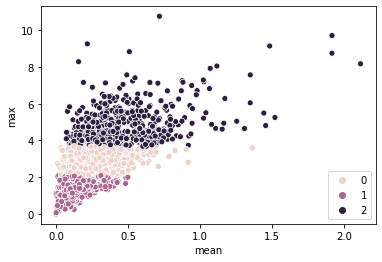

In [156]:
dflr = pd.concat(rs1)

dflr.columns = ["max", "mean"]
#print(dflr.head())

#sns.scatterplot(data=dflr, x="mean", y="max")

from sklearn.cluster import KMeans
# Incorrect number of clusters
dflr["cluster"] = KMeans(n_clusters=3, random_state=0).fit_predict(dflr)

dflr["cluster"] = dflr["cluster"].astype(str)

dflr["cluster"].value_counts()


#dflr.describe()
sns.scatterplot(data=dflr, x="mean", y="max", hue = dflr.cluster.tolist())
#sns.Implot(data=dflr, x="mean", y="max", hue = "cluster")


array([[<AxesSubplot:title={'center':'hurst'}>,
        <AxesSubplot:title={'center':'series_length'}>,
        <AxesSubplot:title={'center':'unitroot_pp'}>,
        <AxesSubplot:title={'center':'unitroot_kpss'}>,
        <AxesSubplot:title={'center':'stability'}>,
        <AxesSubplot:title={'center':'trend'}>],
       [<AxesSubplot:title={'center':'spike'}>,
        <AxesSubplot:title={'center':'linearity'}>,
        <AxesSubplot:title={'center':'curvature'}>,
        <AxesSubplot:title={'center':'e_acf1'}>,
        <AxesSubplot:title={'center':'e_acf10'}>,
        <AxesSubplot:title={'center':'x_pacf5'}>],
       [<AxesSubplot:title={'center':'diff1x_pacf5'}>,
        <AxesSubplot:title={'center':'diff2x_pacf5'}>,
        <AxesSubplot:title={'center':'nonlinearity'}>,
        <AxesSubplot:title={'center':'lumpiness'}>,
        <AxesSubplot:title={'center':'alpha'}>,
        <AxesSubplot:title={'center':'arch_acf'}>],
       [<AxesSubplot:title={'center':'garch_acf'}>,
        <AxesS

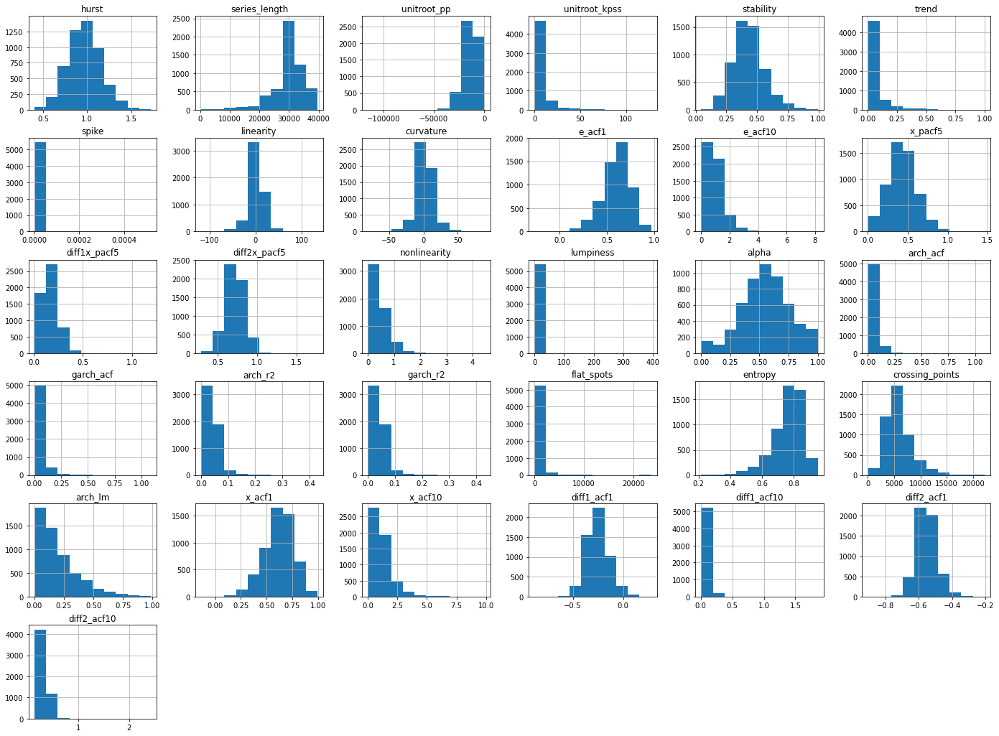

In [41]:
#check.to_csv("timeseries-features.csv", index = False)
check.drop(["unique_id", "seasonal_period"], axis = 1).hist(figsize = (24,18))

In [8]:
df = pd.wide_to_long(df, stubnames = "hh_", i = ['day', 'LCLid'], j = "hh").sort_values(["day", "hh"]).reset_index()
    

In [9]:
df.head()
df.shape

(14999328, 4)

In [10]:
# import time lookup
lookup = pd.read_csv(data_path + "/time-lookup.csv", sep = ",")
lookup.head()

,hh,time
0,0,0:30
1,1,1:00
2,2,1:30
3,3,2:00
4,4,2:30


In [11]:
df.columns = ['ds', 'unique_id', 'hh', 'y']

df = df[["ds", "unique_id", "y"]]
#check.head()
#df.dropna().isnull().sum(axis = 0)
df = df.dropna()
counts = df.groupby(["unique_id"]).agg(["count", "min", "max"])
counts.head()

ds                              y              
           count         min         max  count    min    max
unique_id                                                    
MAC000020  38879  2011-12-08  2014-02-27  38879  0.024  2.009
MAC000021  38927  2011-12-08  2014-02-27  38927  0.093  2.808
MAC000025  38399  2011-12-08  2014-02-27  38399  0.000  3.150
MAC000036  38831  2011-12-08  2014-02-27  38831  0.000  0.701
MAC000047  38591  2011-12-09  2014-02-27  38591  0.018  1.112

In [12]:
#df.shape
df.describe()

n = 400  #chunk row size
list_df = [test[i:i+n] for i in range(0,test.shape[0],n)]

[i.shape for i in list_df]

check = tsfeatures(df.head(500000), freq = 1)

,unique_id,hurst,series_length,unitroot_pp,unitroot_kpss,hw_alpha,hw_beta,hw_gamma,stability,nperiods,...,flat_spots,entropy,crossing_points,arch_lm,x_acf1,x_acf10,diff1_acf1,diff1_acf10,diff2_acf1,diff2_acf10
0,MAC000020,0.794994,6835,-3391.617115,2.545955,NaN,NaN,NaN,0.379419,0,...,360,0.816346,1098,0.082534,0.577126,0.690629,-0.225502,0.092345,-0.512286,0.268034
1,MAC000021,0.771410,6883,-2484.515485,0.351663,NaN,NaN,NaN,0.529250,0,...,170,0.794546,1450,0.201059,0.696944,1.579245,-0.338225,0.118832,-0.623360,0.407608
2,MAC000025,0.537234,6786,-4176.722980,0.118579,NaN,NaN,NaN,0.168347,0,...,151,0.865143,1195,0.018035,0.340890,0.117859,-0.260964,0.116284,-0.518234,0.276367
3,MAC000036,0.547170,6739,-6738.660018,0.161723,NaN,NaN,NaN,0.186203,0,...,24,0.835024,2128,0.004205,0.178783,0.081234,-0.456554,0.232911,-0.636493,0.432063
4,MAC000047,0.907275,6787,-2918.476624,0.809241,NaN,NaN,NaN,0.614413,0,...,26,0.660911,452,0.036567,0.688376,2.503208,-0.494375,0.306396,-0.697495,0.611830


In [144]:
check.shape
check.columns
check = check.drop(["hw_alpha", "hw_beta", "hw_gamma"], axis = 1)
check.describe()


KeyError: "['hw_alpha' 'hw_beta' 'hw_gamma'] not found in axis"

array([[<AxesSubplot:title={'center':'hurst'}>,
        <AxesSubplot:title={'center':'series_length'}>,
        <AxesSubplot:title={'center':'unitroot_pp'}>,
        <AxesSubplot:title={'center':'unitroot_kpss'}>,
        <AxesSubplot:title={'center':'stability'}>,
        <AxesSubplot:title={'center':'seasonal_period'}>],
       [<AxesSubplot:title={'center':'trend'}>,
        <AxesSubplot:title={'center':'spike'}>,
        <AxesSubplot:title={'center':'linearity'}>,
        <AxesSubplot:title={'center':'curvature'}>,
        <AxesSubplot:title={'center':'e_acf1'}>,
        <AxesSubplot:title={'center':'e_acf10'}>],
       [<AxesSubplot:title={'center':'x_pacf5'}>,
        <AxesSubplot:title={'center':'diff1x_pacf5'}>,
        <AxesSubplot:title={'center':'diff2x_pacf5'}>,
        <AxesSubplot:title={'center':'nonlinearity'}>,
        <AxesSubplot:title={'center':'lumpiness'}>,
        <AxesSubplot:title={'center':'alpha'}>],
       [<AxesSubplot:title={'center':'arch_acf'}>,
        

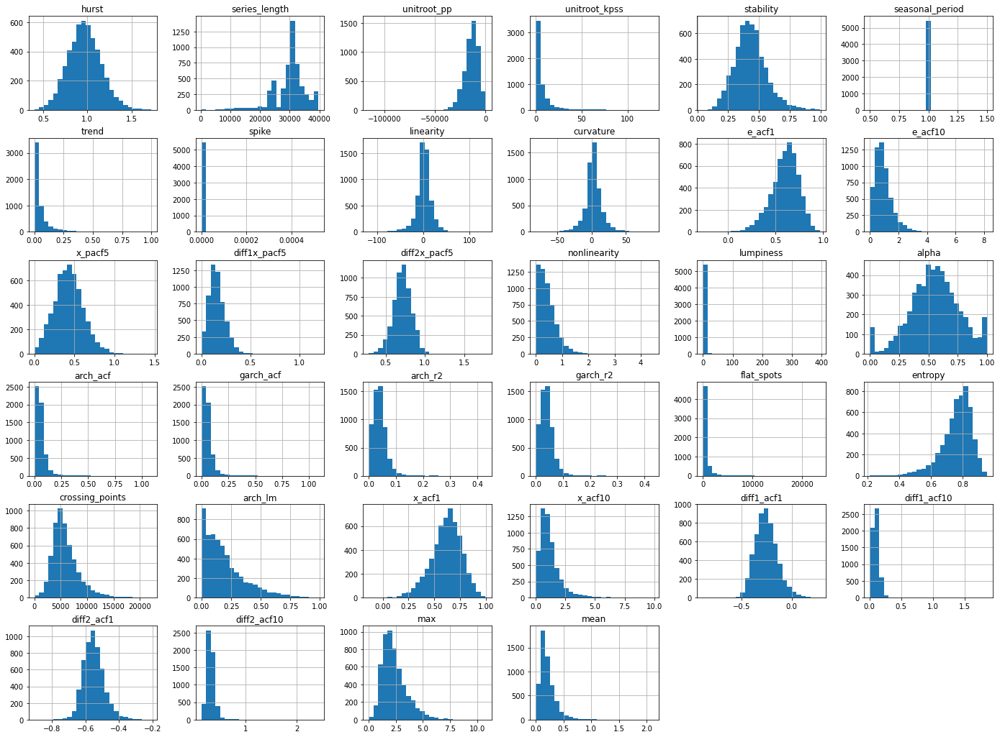

In [145]:
check = pd.merge(check, dflr, on = "unique_id", how = "inner")
check.hist(bins = 25, figsize = (24,18))

In [1]:
import numpy as np

from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler

In [2]:
features = check.drop(["seasonal_period", "unique_id"], axis = 1)

NameError: name 'check' is not defined

In [147]:

X = StandardScaler().fit_transform(features.dropna())

#db = DBSCAN(eps=0.3, min_samples=10).fit(X)
#core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
#core_samples_mask[db.core_sample_indices_] = True
#labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
#n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
#n_noise_ = list(labels).count(-1)

#labels
X.shape
#X.view()

(5177, 34)

array([[<AxesSubplot:title={'center':'0'}>,
        <AxesSubplot:title={'center':'1'}>,
        <AxesSubplot:title={'center':'2'}>,
        <AxesSubplot:title={'center':'3'}>,
        <AxesSubplot:title={'center':'4'}>,
        <AxesSubplot:title={'center':'5'}>],
       [<AxesSubplot:title={'center':'6'}>,
        <AxesSubplot:title={'center':'7'}>,
        <AxesSubplot:title={'center':'8'}>,
        <AxesSubplot:title={'center':'9'}>,
        <AxesSubplot:title={'center':'10'}>,
        <AxesSubplot:title={'center':'11'}>],
       [<AxesSubplot:title={'center':'12'}>,
        <AxesSubplot:title={'center':'13'}>,
        <AxesSubplot:title={'center':'14'}>,
        <AxesSubplot:title={'center':'15'}>,
        <AxesSubplot:title={'center':'16'}>,
        <AxesSubplot:title={'center':'17'}>],
       [<AxesSubplot:title={'center':'18'}>,
        <AxesSubplot:title={'center':'19'}>,
        <AxesSubplot:title={'center':'20'}>,
        <AxesSubplot:title={'center':'21'}>,
        <AxesSubp

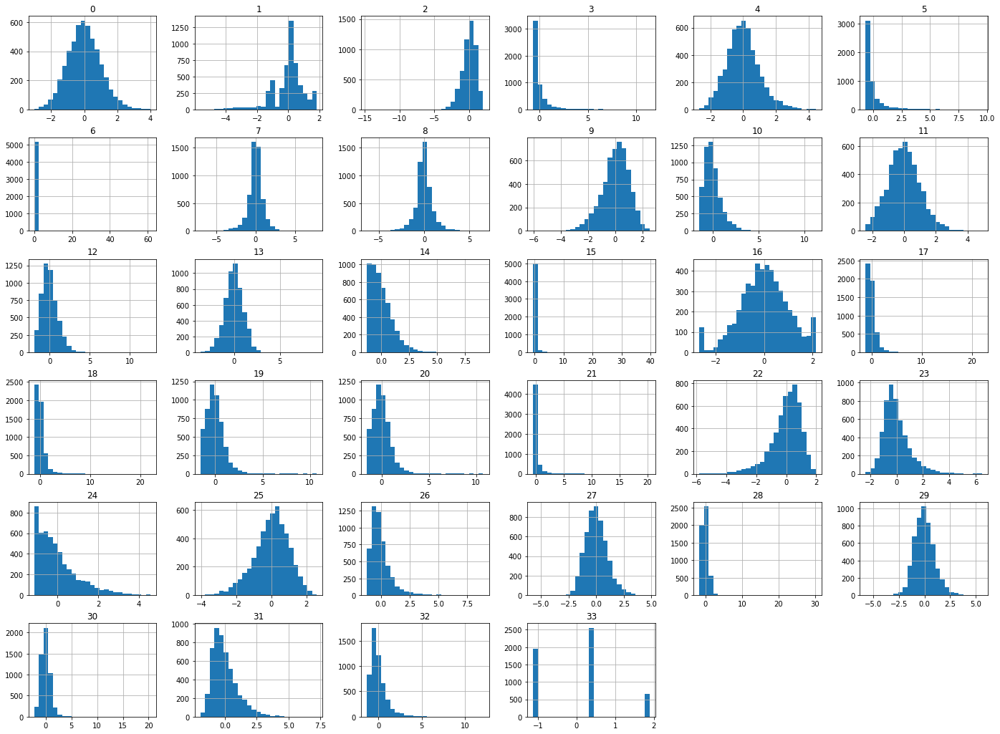

In [148]:
df_x = pd.DataFrame(X)
df_x.hist(bins = 25, figsize = (24, 18))

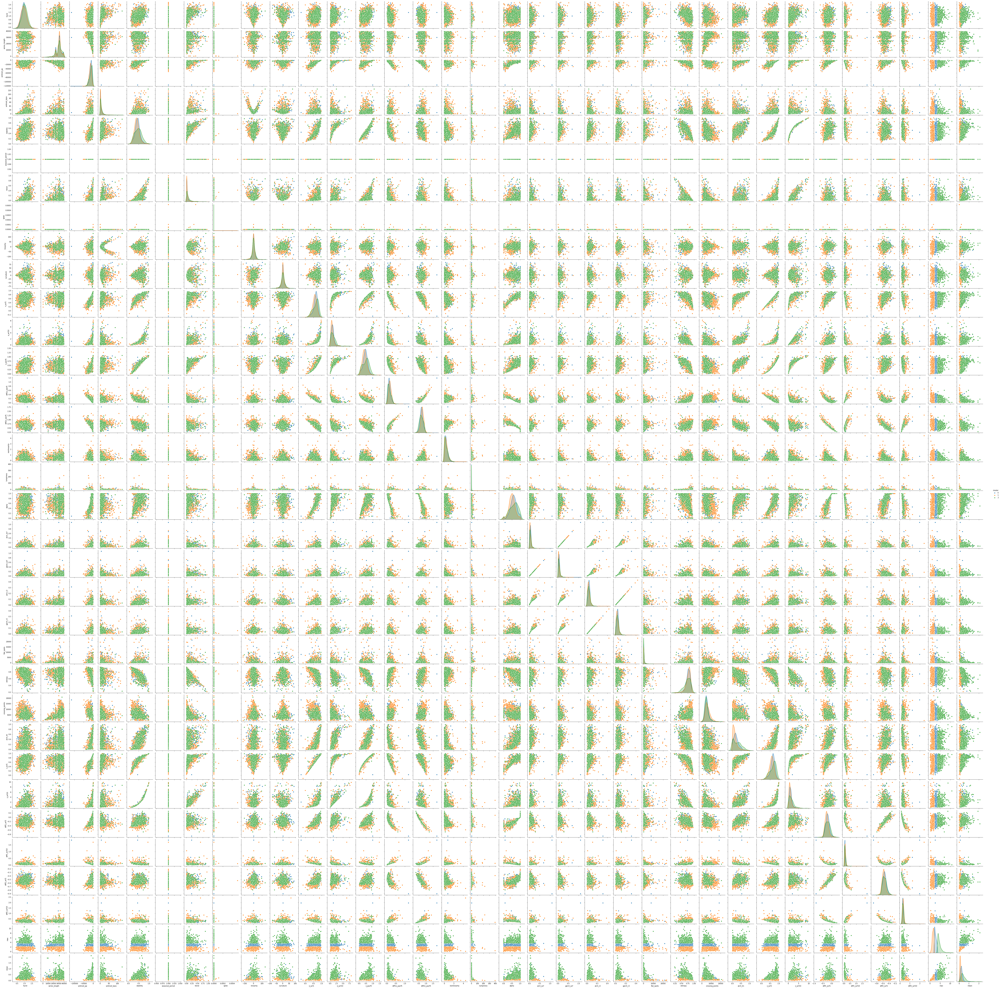

In [152]:
#check.head()
#check.columns
sns.pairplot(check, hue = "cluster")

In [99]:
#t-sne reference
#https://distill.pub/2016/misread-tsne/

from sklearn import manifold, datasets
from functools import partial

n_components = 2
n_neighbors = 10

mani = manifold.TSNE(n_components=2, init='pca', random_state=0).fit_transform(X)
#mani = manifold.MDS(n_components = 2, max_iter=100, n_init=1).fit_transform(X)
#mani = manifold.Isomap(n_neighbors, n_components).fit_transform(X)

#LLE = partial(manifold.LocallyLinearEmbedding,
#              n_neighbors, n_components, eigen_solver='auto')

#mani = LLE(method='standard').fit_transform(X)

mani.view()

mani = pd.DataFrame(mani)
mani.columns = ["X1", "X2"]
mani.head()

,X1,X2
0,41.942013,-31.406429
1,-20.537956,-47.157047
2,8.904388,2.998237
3,80.650116,-19.085474
4,-44.734352,16.891880


In [71]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

principalComponents = pca.fit_transform(X)

mani = pd.DataFrame(data = principalComponents
             , columns = ['X1', 'X2'])

mani.head()



,X1,X2
0,3.355029,0.445889
1,2.609519,6.460550
2,-0.589813,-0.823504
3,6.800210,2.840616
4,-2.983333,3.228106


<AxesSubplot:xlabel='X1', ylabel='X2'>

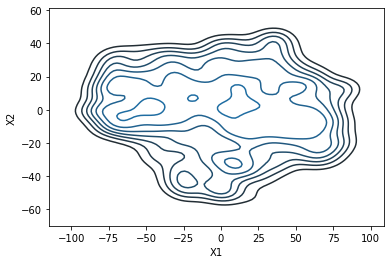

In [102]:
import seaborn as sns
#sns.kdeplot(mani["X1"], mani["X2"], figsize = (24, 18))
sns.kdeplot(mani["X1"], mani["X2"], figsize = (24, 18), fill = True)

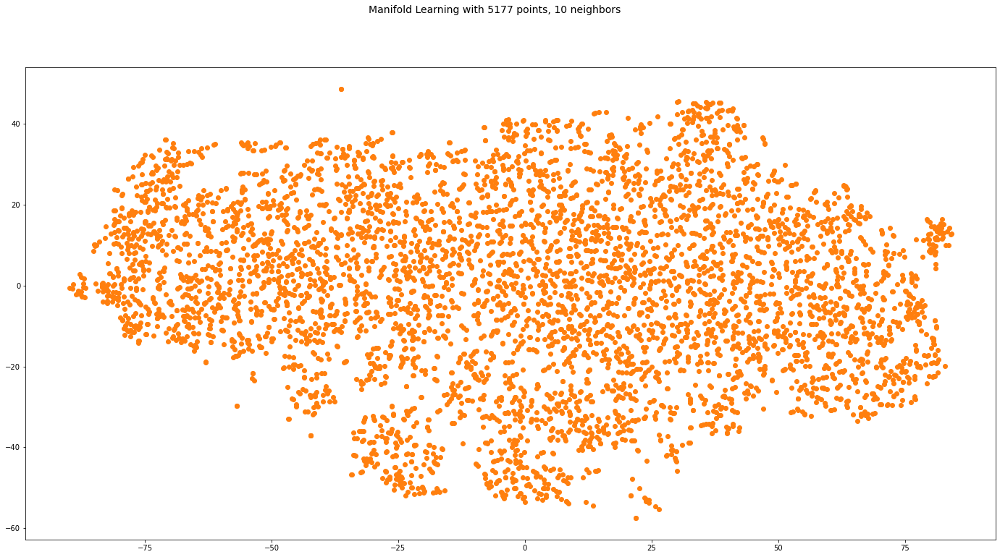

In [101]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter

n_neighbors = 10
n_components = 2

# Create figure
fig = plt.figure(figsize=(24, 12))
fig.suptitle("Manifold Learning with %i points, %i neighbors"
             % (X.shape[0], n_neighbors), fontsize=14)

# Add scatter plot
ax = fig.add_subplot()
#ax.scatter(mani["X1"], mani["X2"], color = "C1", cmap=plt.cm.Spectral)
ax.scatter(mani["X1"], mani["X2"], color = "C1")
#ax.contour(mani["X1"], mani["X1"])


fig.show()



In [ ]:
#methods = OrderedDict()
#methods['LLE'] = LLE(method='standard')
#methods['LTSA'] = LLE(method='ltsa')
#methods['Hessian LLE'] = LLE(method='hessian')
#methods['Modified LLE'] = LLE(method='modified')
#methods['Isomap'] = manifold.Isomap(n_neighbors, n_components)
#methods['MDS'] = manifold.MDS(n_components, max_iter=100, n_init=1)
#methods['SE'] = manifold.SpectralEmbedding(n_components=n_components,
                                           n_neighbors=n_neighbors)
#methods['t-SNE'] = manifold.TSNE(n_components=n_components, init='pca',
                                 random_state=0)

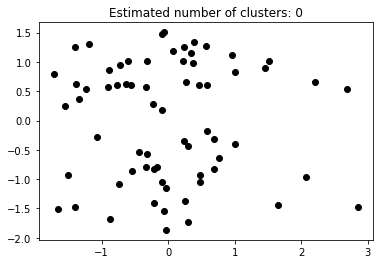

In [58]:
import matplotlib.pyplot as plt

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor = tuple(col),
             markeredgecolor = 'k', markersize = 14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()